In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
%matplotlib inline

# Project 4

The purpose of this assignment is to give you a firm foundation in comparing a variety of linear classifiers.
In this project, you will compare two different algorithms. These algorithms include Adaline and Logistic
Regression. Note that Adaline is covered in the second module and is not presented in the book. If you wish
to learn about Adaline beforehand, you can read the handout (learnsc32.pdf) posted with the assignment in
the module. You will also use the same five datasets (all classification problems) that you used from Project
1 from the UCI Machine Learning Repository, namely:

## Data Export Step 1

Download the five (5) data sets from the UCI Machine Learning repository. You can find this repository
at http://archive.ics.uci.edu/ml/. The data sets are also available in Blackboard. All of the
specific URLs are also provided above

In [3]:
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import random
import patsy
import sklearn.linear_model as linear
import scipy.optimize as opt
from tabulate import tabulate

sns.set(style="whitegrid")
# load whatever other libraries you need including models.py

In [4]:
BreastCancer = pd.read_csv("breast-cancer-wisconsin.data", sep = ',')
BreastCancer.columns = ["Sample_code_number", "Clump_Thickness","Uniformity_CellSize", "Uniformity_CellShape","MarginalAdhesion","SE_CellSize","BareNuclei","BlandChromatin", "NormalNucleoli", "Mitoses", "Class"]

Glass = pd.read_csv("glass.data", sep = ',')
Glass.columns = ["ID", "RefractiveIndex","Sodium", "Mag","Alum","Silicon","K","Calcium", "Barium", "Iron", "GlassType"]
                 
Iris = pd.read_csv("iris.data", sep = ',')
Iris.columns = ["Sepal_L", "Sepal_W","Petal_L", "Petal_W","Class"]  
                 
SoyBean = pd.read_csv("soybean-small.data", sep = ',')   
Soycolumn = ['date',
'plantstand',
'precip',
'temp',
'hail',
'crophist',
'areadamaged',
'severity',
'seedtmt',
'germination',
'plantgrowth',
'leaves',
'leafspotshalo',
'leafspotsmarg',
'leafspotsize',
'leafshread',
'leafmalf',
'leafmild',
'stem',
'lodging',
'stemcankers',
'cankerlesion',
'fruitingbodies',
'externaldecay',
'mycelium',
'intdiscolor',
'sclerotia',
'fruitpods',
'fruitspots',
'seed',
'moldgrowth',
'seeddiscolor',
'seedsize',
'shriveling',
'roots','Distrubution']
SoyBean = pd.read_csv("soybean-small.data", sep = ',')
SoyBean.columns = Soycolumn

HouseVote = pd.read_csv("house-votes-84.data", sep = ',')
HouseVote.columns = ["Class", "Handicap","Water", "Adoption","Physician", "SalvadorAid", "ReligionInSchool", "SatelitteTestBan", "NicaraguanAid","Missile", "Immigration","CorpCutBack","Education","Sue","Crime","DutyFreeExport","ExportAdmin"]
HouseVote = HouseVote[["Handicap","Water", "Adoption","Physician", "SalvadorAid", "ReligionInSchool", "SatelitteTestBan", "NicaraguanAid","Missile", "Immigration","CorpCutBack","Education","Sue","Crime","DutyFreeExport","ExportAdmin", "Class"]]

## Data Pre Process Step 2

In [5]:
def replace_Text(Data, Column, starting = 0):
    j = starting 
    for x in Column:
        Data = Data.replace(x, j)
        j = j+1 
    return Data
 

In [6]:
########################################################   
#Breast Cancer Data Clean up
########################################################
NumberOfDataDropped = 0
for Attribute in ["Sample_code_number", "Clump_Thickness","Uniformity_CellSize", "Uniformity_CellShape","MarginalAdhesion","SE_CellSize","BareNuclei","BlandChromatin", "NormalNucleoli", "Mitoses", "Class"]:
    for i in BreastCancer.query(''+Attribute+' == "?"').index:
        BreastCancer=BreastCancer.drop(i)
        NumberOfDataDropped=NumberOfDataDropped + 1
        
BreastCancer['BareNuclei']=pd.to_numeric(BreastCancer['BareNuclei'])

# create a list of our conditions
conditions = [
    (BreastCancer['Class'] == 2),
    (BreastCancer['Class'] == 4)
    ]


# create a list of the values we want to assign for each condition
values = [1, 0]

# create a new column and use np.select to assign values to it using our lists as arguments
BreastCancer['Class'] = np.select(conditions, values)

BreastCancer=BreastCancer.drop("Sample_code_number",1)

BreastCancer.to_csv('BreastCancer.csv', index = False) 

########################################################   
#Glass Data Clean up
########################################################
GlassType = [1, 2, 3, 5, 6, 7]
Glass = replace_Text(Glass, GlassType)   

########################################################   
#Iris Data Clean up
########################################################
# create a list of our conditions
conditions = [
    (Iris['Class'] == "Iris-setosa"),
    (Iris['Class'] == "Iris-virginica"),
    (Iris['Class'] == "Iris-versicolor")
    ]

# create a list of the values we want to assign for each condition
values = [0, 1, 2]

# create a new column and use np.select to assign values to it using our lists as arguments
Iris['Class'] = np.select(conditions, values)

########################################################   
#Soybean Data Clean up
########################################################

SoycolumnCheck = ['date',
'plantstand',
'precip',
'temp',
'hail',
'crophist',
'areadamaged',
'severity',
'seedtmt',
'germination',
'plantgrowth',
'leaves',
'leafspotshalo',
'leafspotsmarg',
'leafspotsize',
'leafshread',
'leafmalf',
'leafmild',
'stem',
'lodging',
'stemcankers',
'cankerlesion',
'fruitingbodies',
'externaldecay',
'mycelium',
'intdiscolor',
'sclerotia',
'fruitpods',
'fruitspots',
'seed',
'moldgrowth',
'seeddiscolor',
'seedsize',
'shriveling',
'roots']
for Attribute in SoycolumnCheck:
    if SoyBean[Attribute].mean() == 0.0:
        #print(Attribute)
        SoyBean = SoyBean.drop(columns = Attribute)
        
# create a list of our conditions
conditions = [
    (SoyBean['Distrubution'] == "D1"),
    (SoyBean['Distrubution'] == "D2"),
    (SoyBean['Distrubution'] == "D3"),
    (SoyBean['Distrubution'] == "D4")
    ]

# create a list of the values we want to assign for each condition
values = [0, 1, 2, 3]

# create a new column and use np.select to assign values to it using our lists as arguments
SoyBean['Distrubution'] = np.select(conditions, values)

########################################################   
#House Vote Data Clean up
########################################################
########################################################   
#House Vote Data Clean up
########################################################
conditions = [
    (HouseVote['Class'] == "democrat"),
    (HouseVote['Class'] == "republican")
    ]

# create a list of the values we want to assign for each condition
values = [0, 1]

# create a new column and use np.select to assign values to it using our lists as arguments
HouseVote['Class'] = np.select(conditions, values)

HouseVote = HouseVote.replace('y',1)
HouseVote = HouseVote.replace('n',0)
HouseVote = HouseVote.replace('?',2)

## Multiclass Logestic Regression

In [72]:
import numpy as np
import matplotlib.pyplot as plt

class MultiClassLogisticRegression:
    
    def __init__(self, n_iter = 10000, thres=1e-3):
        self.n_iter = n_iter
        self.thres = thres
        print(thres)
    
    def fit(self, X, y, batch_size=64, lr=0.001, rand_seed=4, verbose=False): 
        np.random.seed(rand_seed) 
        # Get all the classes in the Data
        self.classes = np.unique(y)
        self.class_labels = {c:i for i,c in enumerate(self.classes)}
        # Add Bias to Data Set
        X = self.add_bias(X)
        # One hot encode the class
        y = self.one_hot(y)
        #print(y)
        self.loss = []
        #initialize the Weight matrix to zero
        self.weights = np.zeros(shape=(len(self.classes),X.shape[1]))
        self.fit_data(X, y, batch_size, lr, verbose)
        return self
 
    def fit_data(self, X, y, batch_size, lr, verbose):
        i = 0
        while (not self.n_iter or i < self.n_iter):
            self.loss.append(self.cross_entropy(y, self.predict_(X)))
            idx = np.random.choice(X.shape[0], batch_size)
            X_batch, y_batch = X[idx], y[idx]
            error = y_batch - self.predict_(X_batch)
            error
            update = (lr * np.dot(error.T, X_batch))
            self.weights += update
            if np.abs(update).max() < self.thres: break
            if i % 1000 == 0 and verbose: 
                print(' Training Accuray at {} iterations is {}'.format(i, self.evaluate_(X, y)))
            i +=1
    
    def predict(self, X):
        '''
        Return Preidction
        '''
        return self.predict_(self.add_bias(X))
    
    def predict_(self, X):
        '''
        Take the data matrix and do the dot product with the wieight and send with the activation function
        '''
        pre_vals = np.dot(X, self.weights.T).reshape(-1,len(self.classes))
        print(pre_vals)
        return self.softmax(pre_vals)
    
    def softmax(self, z):
        '''
        Softmax function as an activation function
        '''
        return np.exp(z) / np.sum(np.exp(z), axis=1).reshape(-1,1)

    def predict_classes(self, X):
        '''
        Depending on close to which probablibily prediction falls on select the class
        '''
        self.probs_ = self.predict(X)
        return np.vectorize(lambda c: self.classes[c])(np.argmax(self.probs_, axis=1))
  
    def add_bias(self,X):
        '''
        This is to add bias to the Data
        '''
        return np.insert(X, 0, 1, axis=1)

    def score(self, X, y):
        '''
        Get the accuracy_score of the algo
        '''
        return np.mean(self.predict_classes(X) == y)
    
    def one_hot(self, y):
        '''
        In the formula to compute the cost over the training, which is done by cross entropy and in that the target label is one hot encoded.
        '''
        return np.eye(len(self.classes))[np.vectorize(lambda c: self.class_labels[c])(y).reshape(-1)]
    
    def evaluate_(self, X, y):
        '''
        Evaludte the performace of the algo
        '''
        return np.mean(np.argmax(self.predict_(X), axis=1) == np.argmax(y, axis=1))
    
    def cross_entropy(self, y, probs):
        '''
        the cross-entropy loss function Finds which produces the least amount of error
        '''
        J = -1 * np.mean(y * np.log(probs))
        #print(J)
        return -1 * np.mean(y * np.log(probs))

In [73]:
def DiagramInfo(Data, Feature1, Featurer2, Target):
    print(Feature1 +' value is from: ['+str(Data[Feature1].min())+', '+str(Data[Feature1].max())+'] ')
    print(Featurer2 +' value is from: ['+str(Data[Featurer2].min())+', '+str(Data[Featurer2].max())+'] ')
    print('Possible Class for the Data is:')
    print(Target.unique())

          
def MulticlassLogReg(Data, feature1, feature2):   
    
    '''
    This is the main function that needs to take the data and run the classification with 2 features
    This prints the result in color mesh which also show which class is which color and were they are in teh map
    ''' 
    X = Data[[feature1, feature2]].copy()
    Y = Data.iloc[:, -1]
    DiagramInfo(Data, feature1, feature2, Y)
    X = X.to_numpy()
    Y = Y.to_numpy()
    logreg = MultiClassLogisticRegression()
    # Create an instance of Logistic Regression Classifier and fit the data.
    logreg.fit(X, Y)

    # Plot the decision boundary. For that, we will assign a color to each
    # point in the mesh [x_min, x_max]x[y_min, y_max].
    x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
    y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
    h = 0.1  # step size in the mesh
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    Z = logreg.predict_classes(np.c_[xx.ravel(), yy.ravel()])
    
    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.figure(1, figsize=(4, 3))
    c = plt.pcolormesh(xx, yy, Z, cmap=plt.cm.coolwarm)
    plt.colorbar(c) 

    # Plot also the training points
    plt.scatter(X[:, 0], X[:, 1], c=Y, edgecolors='k', cmap=plt.cm.coolwarm)
    plt.xlabel(feature1)
    plt.ylabel(feature2)

    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.xticks(())
    plt.yticks(())

    plt.show()
    print(logreg.score(X, Y))
    
    fig = plt.figure(figsize=(8,6))
    plt.plot(np.arange(len(logreg.loss)), logreg.loss)
    plt.title("Development of loss during training")
    plt.xlabel("Number of iterations")
    plt.ylabel("Loss")
    plt.show()

In [ ]:
def Logisticcc(dataset):
    '''
    Main Function for Adaline. Split the data
    Run the algorithm
    Puts the result of all fold in to a table
    '''
    # Split the dataset into training data, test data and pruning data if needed.
    train_data = dataset[:int(len(dataset)*0.90)]
    test_data = dataset[int(len(dataset)*0.90):len(dataset)]
    X_test = test_data.iloc[:, :-1]
    y_test = test_data.iloc[:, -1]
    score = []
    Fold1, Fold2, Fold3, Fold4, Fold5 = FiveFold(train_data)
    Folds = [Fold1, Fold2, Fold3, Fold4, Fold5]
    for Fold in Folds:
        X = Fold.iloc[:, :-1]
        y = Fold.iloc[:, -1]
        X = X.to_numpy()
        y = y.to_numpy()
        adaline = CustomAdaline(n_iterations = 200)
        # Fit the model
        adaline.fit(X, y)
        # Score the model
        score.append(adaline.score(X, y_test))
        
        #print(score)    
    print(tabulate([['Fold 1', score[0]], ['Fold 2', score[1]], ['Fold 3', score[2]], ['Fold 4', score[3]], ['Fold 5', score[4]]], headers=['Fold', 'Score'], tablefmt='orgtbl'))    


Sepal_L value is from: [4.3, 7.9] 
Sepal_W value is from: [2.0, 4.4] 
Possible Class for the Data is:
[0 2 1]
0.001


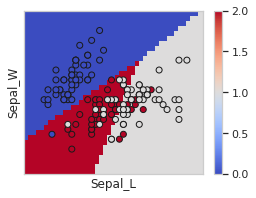

0.8053691275167785


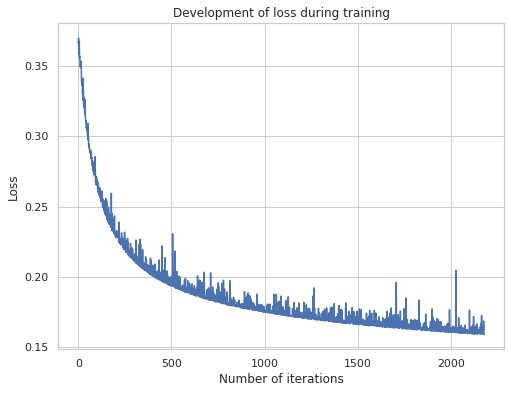

In [69]:
MulticlassLogReg(Iris,'Sepal_L', 'Sepal_W')

Education value is from: [0, 2] 
ReligionInSchool value is from: [0, 2] 
Possible Class for the Data is:
[1 0]
0.001
0.34657359027997264
0.3450081008791955
0.34375402747828904
0.34192314164303705
0.3402513873381995
0.33899708763227365
0.33767541293594533
0.3366288400629474
0.33561472469585496
0.33416422078368285
0.33257822704615236
0.3318943509351761
0.33037298574294677
0.3292710791308859
0.3278039321873437
0.3263744039557515
0.3251760737198059
0.32422622137781926
0.3228731036583339
0.3215519320537456
0.32056268243733993
0.3196985812156276
0.31875757787613596
0.3180142099257875
0.3169242742118304
0.3158315866897394
0.31487816228713167
0.313676748065638
0.31293425281225373
0.3120011483091467
0.311288496427919
0.31023416372163504
0.30945053635651765
0.3085823039047659
0.3072437125319599
0.3064536708450542
0.3053914792403185
0.3043670219862433
0.3037264258687892
0.30278788311934457
0.3027813996187771
0.3017426882704464
0.3008045256100239
0.300003880928947
0.29934362724307095
0.29865705547

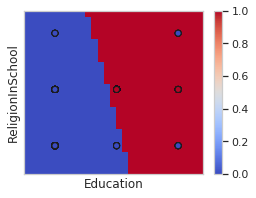

0.8202764976958525


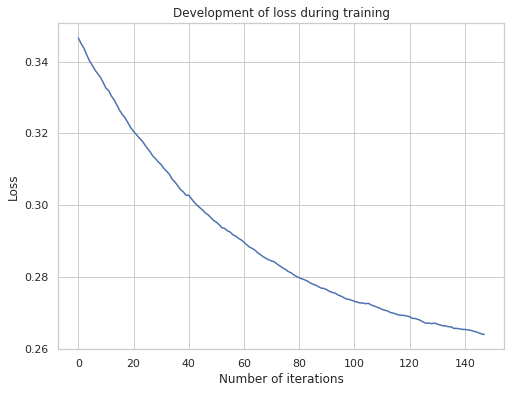

In [71]:
#HouseVote = HouseVote[["Handicap","Water", "Adoption","Physician", "SalvadorAid", "ReligionInSchool", "SatelitteTestBan", "NicaraguanAid","Missile", "Immigration","CorpCutBack","Education","Sue","Crime","DutyFreeExport","ExportAdmin", "Class"]]
MulticlassLogReg(HouseVote, "Education", "ReligionInSchool")

Clump_Thickness value is from: [1, 10] 
Uniformity_CellSize value is from: [1, 10] 
Possible Class for the Data is:
[1 0]


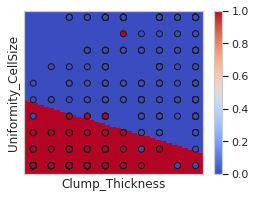

0.9428152492668622


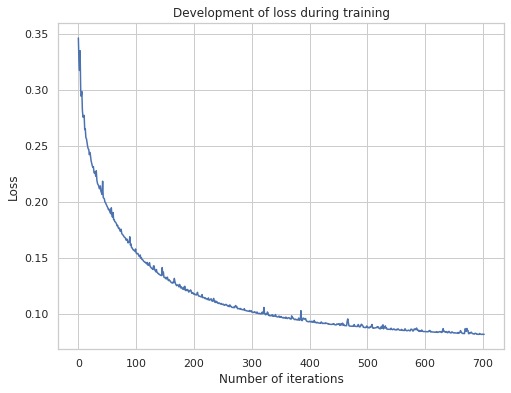

In [11]:

#BreastCancer.columns = ["Sample_code_number", "Clump_Thickness","Uniformity_CellSize", "Uniformity_CellShape","MarginalAdhesion","SE_CellSize","BareNuclei","BlandChromatin", "NormalNucleoli", "Mitoses", "Class"]
MulticlassLogReg(BreastCancer, "Clump_Thickness", "Uniformity_CellSize")

Calcium value is from: [5.43, 16.19] 
Mag value is from: [0.0, 3.98] 
Possible Class for the Data is:
[0 1 2 3 4 5]


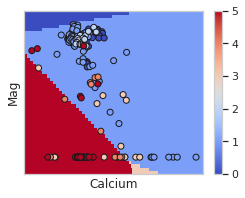

0.460093896713615


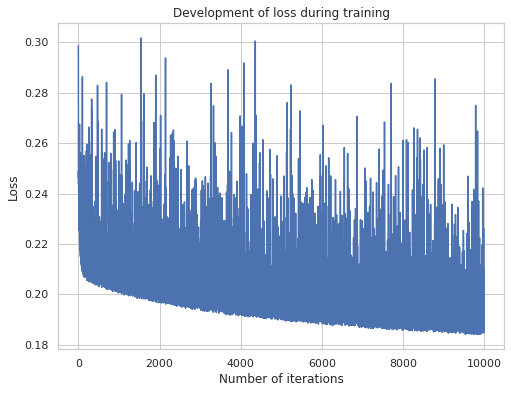

In [12]:
Glass.columns = ["ID", "RefractiveIndex","Sodium", "Mag","Alum","Silicon","K","Calcium", "Barium", "Iron", "GlassType"]
MulticlassLogReg(Glass, "Calcium", "Mag")     

precip value is from: [0, 2] 
temp value is from: [0, 2] 
Possible Class for the Data is:
[0 1 2 3]
0.001
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 

[[ 0.02538557 -0.44653043 -0.03026066  0.45140551]
 [ 0.02538557 -0.44653043 -0.03026066  0.45140551]
 [ 0.02538557 -0.44653043 -0.03026066  0.45140551]
 [ 0.02538557 -0.44653043 -0.03026066  0.45140551]
 [ 0.02538557 -0.44653043 -0.03026066  0.45140551]
 [ 0.02538557 -0.44653043 -0.03026066  0.45140551]
 [ 0.02538557 -0.44653043 -0.03026066  0.45140551]
 [ 0.02538557 -0.44653043 -0.03026066  0.45140551]
 [ 0.02538557 -0.44653043 -0.03026066  0.45140551]
 [-0.03889813  0.43105208 -0.43096427  0.03881033]
 [-0.04857745  0.22315351 -0.22486189  0.05028583]
 [-0.03889813  0.43105208 -0.43096427  0.03881033]
 [-0.04857745  0.22315351 -0.22486189  0.05028583]
 [-0.03889813  0.43105208 -0.43096427  0.03881033]
 [-0.04857745  0.22315351 -0.22486189  0.05028583]
 [-0.04857745  0.22315351 -0.22486189  0.05028583]
 [-0.03889813  0.43105208 -0.43096427  0.03881033]
 [-0.03889813  0.43105208 -0.43096427  0.03881033]
 [-0.03889813  0.43105208 -0.43096427  0.03881033]
 [ 0.01570625 -0.65442899  0.17

[[ 0.06808438 -1.02444672  0.30113392  0.65522843]
 [-0.03840775  0.80513899 -0.75988966 -0.00684158]
 [ 0.01483831 -0.10965387 -0.22937787  0.32419342]
 [ 0.09986502 -0.65038136 -0.06311142  0.61362777]
 [ 0.09986502 -0.65038136 -0.06311142  0.61362777]
 [ 0.06808438 -1.02444672  0.30113392  0.65522843]
 [ 0.09986502 -0.65038136 -0.06311142  0.61362777]
 [ 0.06808438 -1.02444672  0.30113392  0.65522843]
 [ 0.09986502 -0.65038136 -0.06311142  0.61362777]
 [ 0.06808438 -1.02444672  0.30113392  0.65522843]
 [ 0.09986502 -0.65038136 -0.06311142  0.61362777]
 [ 0.09986502 -0.65038136 -0.06311142  0.61362777]
 [ 0.06808438 -1.02444672  0.30113392  0.65522843]
 [ 0.06808438 -1.02444672  0.30113392  0.65522843]
 [-0.01694233 -0.48371922  0.13486747  0.36579409]
 [ 0.09986502 -0.65038136 -0.06311142  0.61362777]
 [ 0.06808438 -1.02444672  0.30113392  0.65522843]
 [ 0.06808438 -1.02444672  0.30113392  0.65522843]
 [ 0.09986502 -0.65038136 -0.06311142  0.61362777]
 [-0.01694233 -0.48371922  0.13

 [ 0.22956497 -0.87132572 -0.08721759  0.72897834]]
[[ 0.15279182 -1.50192161  0.5282034   0.82092639]
 [-0.10216207  0.76845655 -0.65829569 -0.00799879]
 [-0.10216207  0.76845655 -0.65829569 -0.00799879]
 [ 0.22956497 -0.87132572 -0.08721759  0.72897834]
 [ 0.15279182 -1.50192161  0.5282034   0.82092639]
 [ 0.15279182 -1.50192161  0.5282034   0.82092639]
 [-0.10216207  0.76845655 -0.65829569 -0.00799879]
 [ 0.15279182 -1.50192161  0.5282034   0.82092639]
 [ 0.22956497 -0.87132572 -0.08721759  0.72897834]
 [ 0.15279182 -1.50192161  0.5282034   0.82092639]
 [ 0.15279182 -1.50192161  0.5282034   0.82092639]
 [-0.10216207  0.76845655 -0.65829569 -0.00799879]
 [-0.02538892  1.39905244 -1.27371668 -0.09994684]
 [ 0.22956497 -0.87132572 -0.08721759  0.72897834]
 [ 0.15279182 -1.50192161  0.5282034   0.82092639]
 [ 0.15279182 -1.50192161  0.5282034   0.82092639]
 [ 0.15279182 -1.50192161  0.5282034   0.82092639]
 [ 0.22956497 -0.87132572 -0.08721759  0.72897834]
 [ 0.22956497 -0.87132572 -0.0

[[ 0.19445461 -0.95087371  0.00874917  0.74766992]
 [-0.02432096  1.58798737 -1.43595818 -0.12770822]
 [ 0.09511541 -1.66248129  0.7145467   0.85281918]
 [ 0.19445461 -0.95087371  0.00874917  0.74766992]
 [ 0.19445461 -0.95087371  0.00874917  0.74766992]
 [ 0.19445461 -0.95087371  0.00874917  0.74766992]
 [ 0.09511541 -1.66248129  0.7145467   0.85281918]
 [-0.12366017  0.87637979 -0.73016066 -0.02255897]
 [-0.12366017  0.87637979 -0.73016066 -0.02255897]
 [ 0.09511541 -1.66248129  0.7145467   0.85281918]
 [ 0.09511541 -1.66248129  0.7145467   0.85281918]
 [-0.12366017  0.87637979 -0.73016066 -0.02255897]
 [ 0.09511541 -1.66248129  0.7145467   0.85281918]
 [ 0.19445461 -0.95087371  0.00874917  0.74766992]
 [ 0.19445461 -0.95087371  0.00874917  0.74766992]
 [ 0.03539722 -0.03724696 -0.36070574  0.36255548]
 [ 0.19445461 -0.95087371  0.00874917  0.74766992]
 [ 0.19445461 -0.95087371  0.00874917  0.74766992]
 [-0.02432096  1.58798737 -1.43595818 -0.12770822]
 [-0.06394198 -0.74885453  0.34

[[ 0.35732459 -1.06309075 -0.09399108  0.79975724]
 [ 0.35732459 -1.06309075 -0.09399108  0.79975724]
 [ 0.35732459 -1.06309075 -0.09399108  0.79975724]
 [ 0.35732459 -1.06309075 -0.09399108  0.79975724]
 [ 0.35732459 -1.06309075 -0.09399108  0.79975724]
 [ 0.35732459 -1.06309075 -0.09399108  0.79975724]
 [ 0.35732459 -1.06309075 -0.09399108  0.79975724]
 [ 0.35732459 -1.06309075 -0.09399108  0.79975724]
 [ 0.35732459 -1.06309075 -0.09399108  0.79975724]
 [ 0.0535512   1.80608418 -1.70974212 -0.14989326]
 [-0.09664098  1.00148527 -0.87614722 -0.02869707]
 [ 0.0535512   1.80608418 -1.70974212 -0.14989326]
 [-0.09664098  1.00148527 -0.87614722 -0.02869707]
 [ 0.0535512   1.80608418 -1.70974212 -0.14989326]
 [-0.09664098  1.00148527 -0.87614722 -0.02869707]
 [-0.09664098  1.00148527 -0.87614722 -0.02869707]
 [ 0.0535512   1.80608418 -1.70974212 -0.14989326]
 [ 0.0535512   1.80608418 -1.70974212 -0.14989326]
 [ 0.0535512   1.80608418 -1.70974212 -0.14989326]
 [ 0.2071324  -1.86768966  0.73

[[ 3.68959197e-01 -1.14071107e+00 -8.58729040e-02  8.57624775e-01]
 [ 3.68959197e-01 -1.14071107e+00 -8.58729040e-02  8.57624775e-01]
 [ 3.68959197e-01 -1.14071107e+00 -8.58729040e-02  8.57624775e-01]
 [ 3.68959197e-01 -1.14071107e+00 -8.58729040e-02  8.57624775e-01]
 [ 3.68959197e-01 -1.14071107e+00 -8.58729040e-02  8.57624775e-01]
 [ 3.68959197e-01 -1.14071107e+00 -8.58729040e-02  8.57624775e-01]
 [ 3.68959197e-01 -1.14071107e+00 -8.58729040e-02  8.57624775e-01]
 [ 3.68959197e-01 -1.14071107e+00 -8.58729040e-02  8.57624775e-01]
 [ 3.68959197e-01 -1.14071107e+00 -8.58729040e-02  8.57624775e-01]
 [ 6.52919472e-02  2.04062687e+00 -1.94108323e+00 -1.64835586e-01]
 [-1.16589407e-01  1.13792729e+00 -9.90280659e-01 -3.10572267e-02]
 [ 6.52919472e-02  2.04062687e+00 -1.94108323e+00 -1.64835586e-01]
 [-1.16589407e-01  1.13792729e+00 -9.90280659e-01 -3.10572267e-02]
 [ 6.52919472e-02  2.04062687e+00 -1.94108323e+00 -1.64835586e-01]
 [-1.16589407e-01  1.13792729e+00 -9.90280659e-01 -3.10572267e

[[ 3.79140152e-01 -1.24055894e+00 -1.15684282e-01  9.77103069e-01]
 [ 3.79140152e-01 -1.24055894e+00 -1.15684282e-01  9.77103069e-01]
 [ 3.79140152e-01 -1.24055894e+00 -1.15684282e-01  9.77103069e-01]
 [ 3.79140152e-01 -1.24055894e+00 -1.15684282e-01  9.77103069e-01]
 [ 3.79140152e-01 -1.24055894e+00 -1.15684282e-01  9.77103069e-01]
 [ 3.79140152e-01 -1.24055894e+00 -1.15684282e-01  9.77103069e-01]
 [ 3.79140152e-01 -1.24055894e+00 -1.15684282e-01  9.77103069e-01]
 [ 3.79140152e-01 -1.24055894e+00 -1.15684282e-01  9.77103069e-01]
 [ 3.79140152e-01 -1.24055894e+00 -1.15684282e-01  9.77103069e-01]
 [ 9.05205524e-02  2.21726996e+00 -2.17219124e+00 -1.35599277e-01]
 [-1.28489941e-01  1.23853544e+00 -1.10930140e+00 -7.44100911e-04]
 [ 9.05205524e-02  2.21726996e+00 -2.17219124e+00 -1.35599277e-01]
 [-1.28489941e-01  1.23853544e+00 -1.10930140e+00 -7.44100911e-04]
 [ 9.05205524e-02  2.21726996e+00 -2.17219124e+00 -1.35599277e-01]
 [-1.28489941e-01  1.23853544e+00 -1.10930140e+00 -7.44100911e

 [ 0.47045513 -1.301572   -0.08981657  0.92093344]]
[[ 0.47328888 -1.30557846 -0.07409547  0.90638505]
 [ 0.47328888 -1.30557846 -0.07409547  0.90638505]
 [ 0.47328888 -1.30557846 -0.07409547  0.90638505]
 [ 0.47328888 -1.30557846 -0.07409547  0.90638505]
 [ 0.47328888 -1.30557846 -0.07409547  0.90638505]
 [ 0.47328888 -1.30557846 -0.07409547  0.90638505]
 [ 0.47328888 -1.30557846 -0.07409547  0.90638505]
 [ 0.47328888 -1.30557846 -0.07409547  0.90638505]
 [ 0.47328888 -1.30557846 -0.07409547  0.90638505]
 [ 0.14490079  2.37632171 -2.35349432 -0.16772818]
 [-0.114811    1.33154676 -1.19437353 -0.02236223]
 [ 0.14490079  2.37632171 -2.35349432 -0.16772818]
 [-0.114811    1.33154676 -1.19437353 -0.02236223]
 [ 0.14490079  2.37632171 -2.35349432 -0.16772818]
 [-0.114811    1.33154676 -1.19437353 -0.02236223]
 [-0.114811    1.33154676 -1.19437353 -0.02236223]
 [ 0.14490079  2.37632171 -2.35349432 -0.16772818]
 [ 0.14490079  2.37632171 -2.35349432 -0.16772818]
 [ 0.14490079  2.37632171 -2.3

[[ 0.57658634 -1.36361591 -0.10557097  0.89260053]
 [ 0.27881449 -2.45332536  1.12953839  1.04497248]
 [-0.09347703  1.39411914 -1.27541021 -0.02523189]
 [ 0.57658634 -1.36361591 -0.10557097  0.89260053]
 [ 0.57658634 -1.36361591 -0.10557097  0.89260053]
 [ 0.27881449 -2.45332536  1.12953839  1.04497248]
 [ 0.57658634 -1.36361591 -0.10557097  0.89260053]
 [ 0.27881449 -2.45332536  1.12953839  1.04497248]
 [ 0.57658634 -1.36361591 -0.10557097  0.89260053]
 [ 0.20429482  2.48382859 -2.51051957 -0.17760385]
 [ 0.27881449 -2.45332536  1.12953839  1.04497248]
 [-0.09347703  1.39411914 -1.27541021 -0.02523189]
 [ 0.57658634 -1.36361591 -0.10557097  0.89260053]
 [ 0.57658634 -1.36361591 -0.10557097  0.89260053]
 [ 0.57658634 -1.36361591 -0.10557097  0.89260053]
 [ 0.24155466  0.01525162 -0.69049059  0.43368432]
 [ 0.27881449 -2.45332536  1.12953839  1.04497248]
 [ 0.27881449 -2.45332536  1.12953839  1.04497248]
 [ 0.27881449 -2.45332536  1.12953839  1.04497248]
 [-0.05621719 -1.07445784  0.54

 [ 5.90122541e-01 -1.43799325e+00 -1.18140349e-01  9.66011060e-01]]
[[ 0.5846923  -1.44634245 -0.13415312  0.99580327]
 [ 0.5846923  -1.44634245 -0.13415312  0.99580327]
 [ 0.5846923  -1.44634245 -0.13415312  0.99580327]
 [ 0.5846923  -1.44634245 -0.13415312  0.99580327]
 [ 0.5846923  -1.44634245 -0.13415312  0.99580327]
 [ 0.5846923  -1.44634245 -0.13415312  0.99580327]
 [ 0.5846923  -1.44634245 -0.13415312  0.99580327]
 [ 0.5846923  -1.44634245 -0.13415312  0.99580327]
 [ 0.5846923  -1.44634245 -0.13415312  0.99580327]
 [ 0.22989537  2.61640784 -2.71340947 -0.13289374]
 [-0.10366367  1.46965829 -1.37882701  0.01283238]
 [ 0.22989537  2.61640784 -2.71340947 -0.13289374]
 [-0.10366367  1.46965829 -1.37882701  0.01283238]
 [ 0.22989537  2.61640784 -2.71340947 -0.13289374]
 [-0.10366367  1.46965829 -1.37882701  0.01283238]
 [-0.10366367  1.46965829 -1.37882701  0.01283238]
 [ 0.22989537  2.61640784 -2.71340947 -0.13289374]
 [ 0.22989537  2.61640784 -2.71340947 -0.13289374]
 [ 0.22989537 

[[ 0.70158436 -1.52226769 -0.19877067  1.019454  ]
 [ 0.70158436 -1.52226769 -0.19877067  1.019454  ]
 [ 0.70158436 -1.52226769 -0.19877067  1.019454  ]
 [-0.07469458 -1.1901808   0.59155946  0.67331591]
 [ 0.30926143  2.74682023 -2.92475301 -0.13132865]
 [ 0.31205041  0.01145725 -0.84398807  0.52048042]
 [-0.07469458 -1.1901808   0.59155946  0.67331591]
 [-0.07469458 -1.1901808   0.59155946  0.67331591]
 [ 0.70158436 -1.52226769 -0.19877067  1.019454  ]
 [ 0.70158436 -1.52226769 -0.19877067  1.019454  ]
 [ 0.31483938 -2.72390574  1.23677687  1.17228949]
 [ 0.70158436 -1.52226769 -0.19877067  1.019454  ]
 [ 0.70158436 -1.52226769 -0.19877067  1.019454  ]
 [-0.07748355  1.54518219 -1.48920548  0.02150684]
 [-0.07748355  1.54518219 -1.48920548  0.02150684]
 [ 0.31205041  0.01145725 -0.84398807  0.52048042]
 [ 0.31483938 -2.72390574  1.23677687  1.17228949]
 [-0.07748355  1.54518219 -1.48920548  0.02150684]
 [ 0.31483938 -2.72390574  1.23677687  1.17228949]
 [ 0.31483938 -2.72390574  1.23

[[ 0.65906037 -1.57058445 -0.15531257  1.06683665]
 [ 0.65906037 -1.57058445 -0.15531257  1.06683665]
 [ 0.65906037 -1.57058445 -0.15531257  1.06683665]
 [ 0.65906037 -1.57058445 -0.15531257  1.06683665]
 [ 0.65906037 -1.57058445 -0.15531257  1.06683665]
 [ 0.65906037 -1.57058445 -0.15531257  1.06683665]
 [ 0.65906037 -1.57058445 -0.15531257  1.06683665]
 [ 0.65906037 -1.57058445 -0.15531257  1.06683665]
 [ 0.65906037 -1.57058445 -0.15531257  1.06683665]
 [ 0.30303781  2.85714506 -3.06481698 -0.09536589]
 [-0.10284998  1.60946857 -1.55409882  0.04748023]
 [ 0.30303781  2.85714506 -3.06481698 -0.09536589]
 [-0.10284998  1.60946857 -1.55409882  0.04748023]
 [ 0.30303781  2.85714506 -3.06481698 -0.09536589]
 [-0.10284998  1.60946857 -1.55409882  0.04748023]
 [-0.10284998  1.60946857 -1.55409882  0.04748023]
 [ 0.30303781  2.85714506 -3.06481698 -0.09536589]
 [ 0.30303781  2.85714506 -3.06481698 -0.09536589]
 [ 0.30303781  2.85714506 -3.06481698 -0.09536589]
 [ 0.25317258 -2.81826094  1.35

[[ 0.64755447 -1.61193117 -0.19632518  1.16070187]
 [ 0.64755447 -1.61193117 -0.19632518  1.16070187]
 [ 0.64755447 -1.61193117 -0.19632518  1.16070187]
 [ 0.64755447 -1.61193117 -0.19632518  1.16070187]
 [ 0.64755447 -1.61193117 -0.19632518  1.16070187]
 [ 0.64755447 -1.61193117 -0.19632518  1.16070187]
 [ 0.64755447 -1.61193117 -0.19632518  1.16070187]
 [ 0.64755447 -1.61193117 -0.19632518  1.16070187]
 [ 0.64755447 -1.61193117 -0.19632518  1.16070187]
 [ 0.30730746  2.91937677 -3.18113522 -0.04554902]
 [-0.11368276  1.6451533  -1.61602252  0.08455198]
 [ 0.30730746  2.91937677 -3.18113522 -0.04554902]
 [-0.11368276  1.6451533  -1.61602252  0.08455198]
 [ 0.30730746  2.91937677 -3.18113522 -0.04554902]
 [-0.11368276  1.6451533  -1.61602252  0.08455198]
 [-0.11368276  1.6451533  -1.61602252  0.08455198]
 [ 0.30730746  2.91937677 -3.18113522 -0.04554902]
 [ 0.30730746  2.91937677 -3.18113522 -0.04554902]
 [ 0.30730746  2.91937677 -3.18113522 -0.04554902]
 [ 0.22656426 -2.88615464  1.36

[[ 0.78276818 -1.65532674 -0.17299618  1.04555474]
 [ 0.31746805 -2.96511216  1.45952869  1.18811542]
 [ 0.78276818 -1.65532674 -0.17299618  1.04555474]
 [-0.11289927 -1.28999935  0.70751265  0.69538598]
 [ 0.38733367  3.0046843  -3.30955315 -0.08246482]
 [ 0.78276818 -1.65532674 -0.17299618  1.04555474]
 [ 0.38733367  3.0046843  -3.30955315 -0.08246482]
 [ 0.78276818 -1.65532674 -0.17299618  1.04555474]
 [-0.07796646  1.69489888 -1.67702828  0.06009586]
 [ 0.78276818 -1.65532674 -0.17299618  1.04555474]
 [ 0.31746805 -2.96511216  1.45952869  1.18811542]
 [ 0.31746805 -2.96511216  1.45952869  1.18811542]
 [ 0.78276818 -1.65532674 -0.17299618  1.04555474]
 [ 0.31746805 -2.96511216  1.45952869  1.18811542]
 [ 0.78276818 -1.65532674 -0.17299618  1.04555474]
 [ 0.38733367  3.0046843  -3.30955315 -0.08246482]
 [ 0.38733367  3.0046843  -3.30955315 -0.08246482]
 [ 0.31746805 -2.96511216  1.45952869  1.18811542]
 [ 0.78276818 -1.65532674 -0.17299618  1.04555474]
 [ 0.78276818 -1.65532674 -0.17

[[ 0.76688458 -1.70283628 -0.23757084  1.17352254]
 [ 0.76688458 -1.70283628 -0.23757084  1.17352254]
 [-0.09166317  1.73380848 -1.75041021  0.10826489]
 [ 0.76688458 -1.70283628 -0.23757084  1.17352254]
 [ 0.39254376  3.07296139 -3.4432261  -0.02227905]
 [ 0.76688458 -1.70283628 -0.23757084  1.17352254]
 [ 0.76688458 -1.70283628 -0.23757084  1.17352254]
 [ 0.28267765 -3.04198918  1.45524505  1.30406648]
 [ 0.76688458 -1.70283628 -0.23757084  1.17352254]
 [ 0.28267765 -3.04198918  1.45524505  1.30406648]
 [ 0.28267765 -3.04198918  1.45524505  1.30406648]
 [ 0.28267765 -3.04198918  1.45524505  1.30406648]
 [ 0.76688458 -1.70283628 -0.23757084  1.17352254]
 [-0.09166317  1.73380848 -1.75041021  0.10826489]
 [ 0.76688458 -1.70283628 -0.23757084  1.17352254]
 [ 0.28267765 -3.04198918  1.45524505  1.30406648]
 [ 0.76688458 -1.70283628 -0.23757084  1.17352254]
 [ 0.39254376  3.07296139 -3.4432261  -0.02227905]
 [ 0.28267765 -3.04198918  1.45524505  1.30406648]
 [ 0.76688458 -1.70283628 -0.23

[[ 7.23837266e-01 -1.71723369e+00 -2.53514406e-01  1.24691083e+00]
 [ 7.23837266e-01 -1.71723369e+00 -2.53514406e-01  1.24691083e+00]
 [ 7.23837266e-01 -1.71723369e+00 -2.53514406e-01  1.24691083e+00]
 [ 7.23837266e-01 -1.71723369e+00 -2.53514406e-01  1.24691083e+00]
 [ 7.23837266e-01 -1.71723369e+00 -2.53514406e-01  1.24691083e+00]
 [ 7.23837266e-01 -1.71723369e+00 -2.53514406e-01  1.24691083e+00]
 [ 7.23837266e-01 -1.71723369e+00 -2.53514406e-01  1.24691083e+00]
 [ 7.23837266e-01 -1.71723369e+00 -2.53514406e-01  1.24691083e+00]
 [ 7.23837266e-01 -1.71723369e+00 -2.53514406e-01  1.24691083e+00]
 [ 3.77688403e-01  3.15286383e+00 -3.53314921e+00  2.59697795e-03]
 [-1.15232664e-01  1.78179449e+00 -1.79797667e+00  1.31414845e-01]
 [ 3.77688403e-01  3.15286383e+00 -3.53314921e+00  2.59697795e-03]
 [-1.15232664e-01  1.78179449e+00 -1.79797667e+00  1.31414845e-01]
 [ 3.77688403e-01  3.15286383e+00 -3.53314921e+00  2.59697795e-03]
 [-1.15232664e-01  1.78179449e+00 -1.79797667e+00  1.31414845e

[[ 0.37668622  0.03834543 -1.05198486  0.63695321]
 [ 0.31385057 -3.13741072  1.51462978  1.30893037]
 [-0.08600775  1.81845115 -1.84141297  0.10896956]
 [ 0.31385057 -3.13741072  1.51462978  1.30893037]
 [ 0.83938019 -1.7417603  -0.26255675  1.16493686]
 [-0.1488434  -1.35730499  0.72520167  0.78094672]
 [-0.1488434  -1.35730499  0.72520167  0.78094672]
 [ 0.83938019 -1.7417603  -0.26255675  1.16493686]
 [-0.08600775  1.81845115 -1.84141297  0.10896956]
 [-0.1488434  -1.35730499  0.72520167  0.78094672]
 [ 0.31385057 -3.13741072  1.51462978  1.30893037]
 [ 0.43952188  3.21410158 -3.6185995  -0.03502395]
 [ 0.83938019 -1.7417603  -0.26255675  1.16493686]
 [ 0.31385057 -3.13741072  1.51462978  1.30893037]
 [-0.08600775  1.81845115 -1.84141297  0.10896956]
 [ 0.31385057 -3.13741072  1.51462978  1.30893037]
 [ 0.43952188  3.21410158 -3.6185995  -0.03502395]
 [ 0.43952188  3.21410158 -3.6185995  -0.03502395]
 [ 0.83938019 -1.7417603  -0.26255675  1.16493686]
 [ 0.83938019 -1.7417603  -0.26

[[ 0.89363791 -1.7706576  -0.30239262  1.1794123 ]
 [ 0.89363791 -1.7706576  -0.30239262  1.1794123 ]
 [ 0.34320538 -3.19070936  1.51687676  1.33062723]
 [-0.07612211  1.852909   -1.89213653  0.11534965]
 [ 0.34320538 -3.19070936  1.51687676  1.33062723]
 [ 0.89363791 -1.7706576  -0.30239262  1.1794123 ]
 [ 0.34320538 -3.19070936  1.51687676  1.33062723]
 [ 0.89363791 -1.7706576  -0.30239262  1.1794123 ]
 [ 0.34320538 -3.19070936  1.51687676  1.33062723]
 [ 0.47431042  3.27296076 -3.71140591 -0.03586528]
 [ 0.89363791 -1.7706576  -0.30239262  1.1794123 ]
 [ 0.4087579   0.0411257  -1.09726457  0.64738097]
 [ 0.34320538 -3.19070936  1.51687676  1.33062723]
 [ 0.47431042  3.27296076 -3.71140591 -0.03586528]
 [ 0.4087579   0.0411257  -1.09726457  0.64738097]
 [-0.07612211  1.852909   -1.89213653  0.11534965]
 [ 0.89363791 -1.7706576  -0.30239262  1.1794123 ]
 [ 0.89363791 -1.7706576  -0.30239262  1.1794123 ]
 [ 0.34320538 -3.19070936  1.51687676  1.33062723]
 [ 0.89363791 -1.7706576  -0.30

[[ 0.94224248 -1.80329042 -0.27041299  1.13146093]
 [ 0.94224248 -1.80329042 -0.27041299  1.13146093]
 [ 0.94224248 -1.80329042 -0.27041299  1.13146093]
 [ 0.94224248 -1.80329042 -0.27041299  1.13146093]
 [ 0.94224248 -1.80329042 -0.27041299  1.13146093]
 [ 0.94224248 -1.80329042 -0.27041299  1.13146093]
 [ 0.94224248 -1.80329042 -0.27041299  1.13146093]
 [ 0.94224248 -1.80329042 -0.27041299  1.13146093]
 [ 0.94224248 -1.80329042 -0.27041299  1.13146093]
 [ 0.51463574  3.34090097 -3.80499543 -0.05054129]
 [-0.06613517  1.89275904 -1.93554753  0.10892366]
 [ 0.51463574  3.34090097 -3.80499543 -0.05054129]
 [-0.06613517  1.89275904 -1.93554753  0.10892366]
 [ 0.51463574  3.34090097 -3.80499543 -0.05054129]
 [-0.06613517  1.89275904 -1.93554753  0.10892366]
 [-0.06613517  1.89275904 -1.93554753  0.10892366]
 [ 0.51463574  3.34090097 -3.80499543 -0.05054129]
 [ 0.51463574  3.34090097 -3.80499543 -0.05054129]
 [ 0.51463574  3.34090097 -3.80499543 -0.05054129]
 [ 0.36147158 -3.25143236  1.59

[[ 0.92352111 -1.83204686 -0.33295878  1.24148454]
 [ 0.92352111 -1.83204686 -0.33295878  1.24148454]
 [ 0.92352111 -1.83204686 -0.33295878  1.24148454]
 [ 0.92352111 -1.83204686 -0.33295878  1.24148454]
 [ 0.92352111 -1.83204686 -0.33295878  1.24148454]
 [ 0.92352111 -1.83204686 -0.33295878  1.24148454]
 [ 0.92352111 -1.83204686 -0.33295878  1.24148454]
 [ 0.92352111 -1.83204686 -0.33295878  1.24148454]
 [ 0.92352111 -1.83204686 -0.33295878  1.24148454]
 [ 0.51528779  3.41674065 -3.92516477 -0.00686367]
 [-0.08159496  1.93760119 -2.0016505   0.14564427]
 [ 0.51528779  3.41674065 -3.92516477 -0.00686367]
 [-0.08159496  1.93760119 -2.0016505   0.14564427]
 [ 0.51528779  3.41674065 -3.92516477 -0.00686367]
 [-0.08159496  1.93760119 -2.0016505   0.14564427]
 [-0.08159496  1.93760119 -2.0016505   0.14564427]
 [ 0.51528779  3.41674065 -3.92516477 -0.00686367]
 [ 0.51528779  3.41674065 -3.92516477 -0.00686367]
 [ 0.51528779  3.41674065 -3.92516477 -0.00686367]
 [ 0.32663835 -3.31118632  1.59

[[ 0.98698718 -1.85924538 -0.32443572  1.19669391]
 [ 0.98698718 -1.85924538 -0.32443572  1.19669391]
 [ 0.98698718 -1.85924538 -0.32443572  1.19669391]
 [ 0.98698718 -1.85924538 -0.32443572  1.19669391]
 [ 0.98698718 -1.85924538 -0.32443572  1.19669391]
 [ 0.98698718 -1.85924538 -0.32443572  1.19669391]
 [ 0.98698718 -1.85924538 -0.32443572  1.19669391]
 [ 0.98698718 -1.85924538 -0.32443572  1.19669391]
 [ 0.98698718 -1.85924538 -0.32443572  1.19669391]
 [ 0.55436179  3.5029704  -4.0316684  -0.02566379]
 [-0.07312531  1.988658   -2.05568065  0.14014797]
 [ 0.55436179  3.5029704  -4.0316684  -0.02566379]
 [-0.07312531  1.988658   -2.05568065  0.14014797]
 [ 0.55436179  3.5029704  -4.0316684  -0.02566379]
 [-0.07312531  1.988658   -2.05568065  0.14014797]
 [-0.07312531  1.988658   -2.05568065  0.14014797]
 [ 0.55436179  3.5029704  -4.0316684  -0.02566379]
 [ 0.55436179  3.5029704  -4.0316684  -0.02566379]
 [ 0.55436179  3.5029704  -4.0316684  -0.02566379]
 [ 0.35950008 -3.37355778  1.65

[[ 1.02925051 -1.89766324 -0.40567463  1.27408735]
 [ 1.02925051 -1.89766324 -0.40567463  1.27408735]
 [ 1.02925051 -1.89766324 -0.40567463  1.27408735]
 [ 1.02925051 -1.89766324 -0.40567463  1.27408735]
 [ 1.02925051 -1.89766324 -0.40567463  1.27408735]
 [ 1.02925051 -1.89766324 -0.40567463  1.27408735]
 [ 1.02925051 -1.89766324 -0.40567463  1.27408735]
 [ 1.02925051 -1.89766324 -0.40567463  1.27408735]
 [ 1.02925051 -1.89766324 -0.40567463  1.27408735]
 [ 0.59706217  3.56720519 -4.15067752 -0.01358983]
 [-0.06354464  2.02623875 -2.12364857  0.16095446]
 [ 0.59706217  3.56720519 -4.15067752 -0.01358983]
 [-0.06354464  2.02623875 -2.12364857  0.16095446]
 [ 0.59706217  3.56720519 -4.15067752 -0.01358983]
 [-0.06354464  2.02623875 -2.12364857  0.16095446]
 [-0.06354464  2.02623875 -2.12364857  0.16095446]
 [ 0.59706217  3.56720519 -4.15067752 -0.01358983]
 [ 0.59706217  3.56720519 -4.15067752 -0.01358983]
 [ 0.59706217  3.56720519 -4.15067752 -0.01358983]
 [ 0.3686437  -3.43862968  1.62

[[ 1.06322183 -1.91188827 -0.39057799  1.23924442]
 [ 1.06322183 -1.91188827 -0.39057799  1.23924442]
 [ 1.06322183 -1.91188827 -0.39057799  1.23924442]
 [ 1.06322183 -1.91188827 -0.39057799  1.23924442]
 [ 1.06322183 -1.91188827 -0.39057799  1.23924442]
 [ 1.06322183 -1.91188827 -0.39057799  1.23924442]
 [ 1.06322183 -1.91188827 -0.39057799  1.23924442]
 [ 1.06322183 -1.91188827 -0.39057799  1.23924442]
 [ 1.06322183 -1.91188827 -0.39057799  1.23924442]
 [ 0.62841238  3.63911399 -4.23079979 -0.03672658]
 [-0.05768474  2.06935469 -2.16289891  0.15122896]
 [ 0.62841238  3.63911399 -4.23079979 -0.03672658]
 [-0.05768474  2.06935469 -2.16289891  0.15122896]
 [ 0.62841238  3.63911399 -4.23079979 -0.03672658]
 [-0.05768474  2.06935469 -2.16289891  0.15122896]
 [-0.05768474  2.06935469 -2.16289891  0.15122896]
 [ 0.62841238  3.63911399 -4.23079979 -0.03672658]
 [ 0.62841238  3.63911399 -4.23079979 -0.03672658]
 [ 0.62841238  3.63911399 -4.23079979 -0.03672658]
 [ 0.37712471 -3.48164756  1.67

[[ 1.04108216e+00 -1.93970464e+00 -3.89087501e-01  1.28770998e+00]
 [ 6.25985955e-01  3.69068104e+00 -4.31308453e+00 -3.58246987e-03]
 [ 6.25985955e-01  3.69068104e+00 -4.31308453e+00 -3.58246987e-03]
 [ 3.42809405e-01 -3.53067898e+00  1.72008981e+00  1.46777977e+00]
 [-2.13875072e-01 -1.51097331e+00  8.12679949e-01  9.12168437e-01]
 [ 1.04108216e+00 -1.93970464e+00 -3.89087501e-01  1.28770998e+00]
 [ 1.04108216e+00 -1.93970464e+00 -3.89087501e-01  1.28770998e+00]
 [ 3.42809405e-01 -3.53067898e+00  1.72008981e+00  1.46777977e+00]
 [ 3.42809405e-01 -3.53067898e+00  1.72008981e+00  1.46777977e+00]
 [ 1.04108216e+00 -1.93970464e+00 -3.89087501e-01  1.28770998e+00]
 [-7.22867968e-02  2.09970670e+00 -2.20390722e+00  1.76487317e-01]
 [ 3.42809405e-01 -3.53067898e+00  1.72008981e+00  1.46777977e+00]
 [ 1.04108216e+00 -1.93970464e+00 -3.89087501e-01  1.28770998e+00]
 [ 1.04108216e+00 -1.93970464e+00 -3.89087501e-01  1.28770998e+00]
 [ 1.04108216e+00 -1.93970464e+00 -3.89087501e-01  1.28770998e

[[ 0.99555437 -1.97889176 -0.35517144  1.33850883]
 [ 0.99555437 -1.97889176 -0.35517144  1.33850883]
 [ 0.99555437 -1.97889176 -0.35517144  1.33850883]
 [ 0.99555437 -1.97889176 -0.35517144  1.33850883]
 [ 0.99555437 -1.97889176 -0.35517144  1.33850883]
 [ 0.99555437 -1.97889176 -0.35517144  1.33850883]
 [ 0.99555437 -1.97889176 -0.35517144  1.33850883]
 [ 0.99555437 -1.97889176 -0.35517144  1.33850883]
 [ 0.99555437 -1.97889176 -0.35517144  1.33850883]
 [ 0.61821619  3.72932822 -4.38868357  0.04113917]
 [-0.09162775  2.12180481 -2.23790352  0.20772647]
 [ 0.61821619  3.72932822 -4.38868357  0.04113917]
 [-0.09162775  2.12180481 -2.23790352  0.20772647]
 [ 0.61821619  3.72932822 -4.38868357  0.04113917]
 [-0.09162775  2.12180481 -2.23790352  0.20772647]
 [-0.09162775  2.12180481 -2.23790352  0.20772647]
 [ 0.61821619  3.72932822 -4.38868357  0.04113917]
 [ 0.61821619  3.72932822 -4.38868357  0.04113917]
 [ 0.61821619  3.72932822 -4.38868357  0.04113917]
 [ 0.28571043 -3.58641517  1.79

[[ 1.06996143 -2.00472827 -0.37159456  1.3063614 ]
 [ 1.06996143 -2.00472827 -0.37159456  1.3063614 ]
 [ 1.06996143 -2.00472827 -0.37159456  1.3063614 ]
 [ 1.06996143 -2.00472827 -0.37159456  1.3063614 ]
 [ 1.06996143 -2.00472827 -0.37159456  1.3063614 ]
 [ 1.06996143 -2.00472827 -0.37159456  1.3063614 ]
 [ 1.06996143 -2.00472827 -0.37159456  1.3063614 ]
 [ 1.06996143 -2.00472827 -0.37159456  1.3063614 ]
 [ 1.06996143 -2.00472827 -0.37159456  1.3063614 ]
 [ 0.66991355  3.78099816 -4.47558705  0.02467534]
 [-0.07175164  2.15251657 -2.28389495  0.20313001]
 [ 0.66991355  3.78099816 -4.47558705  0.02467534]
 [-0.07175164  2.15251657 -2.28389495  0.20313001]
 [ 0.66991355  3.78099816 -4.47558705  0.02467534]
 [-0.07175164  2.15251657 -2.28389495  0.20313001]
 [-0.07175164  2.15251657 -2.28389495  0.20313001]
 [ 0.66991355  3.78099816 -4.47558705  0.02467534]
 [ 0.66991355  3.78099816 -4.47558705  0.02467534]
 [ 0.66991355  3.78099816 -4.47558705  0.02467534]
 [ 0.32829624 -3.63320986  1.82

[[ 1.1284416  -2.02414721 -0.36681136  1.26251696]
 [ 1.1284416  -2.02414721 -0.36681136  1.26251696]
 [ 1.1284416  -2.02414721 -0.36681136  1.26251696]
 [ 1.1284416  -2.02414721 -0.36681136  1.26251696]
 [ 1.1284416  -2.02414721 -0.36681136  1.26251696]
 [ 1.1284416  -2.02414721 -0.36681136  1.26251696]
 [ 1.1284416  -2.02414721 -0.36681136  1.26251696]
 [ 1.1284416  -2.02414721 -0.36681136  1.26251696]
 [ 1.1284416  -2.02414721 -0.36681136  1.26251696]
 [ 0.70813223  3.8233608  -4.54397586  0.01248283]
 [-0.0569794   2.17760741 -2.31791283  0.19728482]
 [ 0.70813223  3.8233608  -4.54397586  0.01248283]
 [-0.0569794   2.17760741 -2.31791283  0.19728482]
 [ 0.70813223  3.8233608  -4.54397586  0.01248283]
 [-0.0569794   2.17760741 -2.31791283  0.19728482]
 [-0.0569794   2.17760741 -2.31791283  0.19728482]
 [ 0.70813223  3.8233608  -4.54397586  0.01248283]
 [ 0.70813223  3.8233608  -4.54397586  0.01248283]
 [ 0.70813223  3.8233608  -4.54397586  0.01248283]
 [ 0.36332997 -3.6699006   1.85

[[ 1.0897518  -2.0629871  -0.39580773  1.36904303]
 [ 1.0897518  -2.0629871  -0.39580773  1.36904303]
 [ 1.0897518  -2.0629871  -0.39580773  1.36904303]
 [ 1.0897518  -2.0629871  -0.39580773  1.36904303]
 [ 1.0897518  -2.0629871  -0.39580773  1.36904303]
 [ 1.0897518  -2.0629871  -0.39580773  1.36904303]
 [ 1.0897518  -2.0629871  -0.39580773  1.36904303]
 [ 1.0897518  -2.0629871  -0.39580773  1.36904303]
 [ 1.0897518  -2.0629871  -0.39580773  1.36904303]
 [ 0.70259146  3.86554515 -4.63849371  0.0703571 ]
 [-0.07592232  2.20171778 -2.36865903  0.24286357]
 [ 0.70259146  3.86554515 -4.63849371  0.0703571 ]
 [-0.07592232  2.20171778 -2.36865903  0.24286357]
 [ 0.70259146  3.86554515 -4.63849371  0.0703571 ]
 [-0.07592232  2.20171778 -2.36865903  0.24286357]
 [-0.07592232  2.20171778 -2.36865903  0.24286357]
 [ 0.70259146  3.86554515 -4.63849371  0.0703571 ]
 [ 0.70259146  3.86554515 -4.63849371  0.0703571 ]
 [ 0.70259146  3.86554515 -4.63849371  0.0703571 ]
 [ 0.31123802 -3.72681447  1.87

[[ 1.14420312 -2.08263435 -0.40268443  1.34111566]
 [ 1.14420312 -2.08263435 -0.40268443  1.34111566]
 [ 1.14420312 -2.08263435 -0.40268443  1.34111566]
 [ 1.14420312 -2.08263435 -0.40268443  1.34111566]
 [ 1.14420312 -2.08263435 -0.40268443  1.34111566]
 [ 1.14420312 -2.08263435 -0.40268443  1.34111566]
 [ 1.14420312 -2.08263435 -0.40268443  1.34111566]
 [ 1.14420312 -2.08263435 -0.40268443  1.34111566]
 [ 1.14420312 -2.08263435 -0.40268443  1.34111566]
 [ 0.7396163   3.9270076  -4.72901661  0.06239271]
 [-0.06554656  2.2385251  -2.41612012  0.24314159]
 [ 0.7396163   3.9270076  -4.72901661  0.06239271]
 [-0.06554656  2.2385251  -2.41612012  0.24314159]
 [ 0.7396163   3.9270076  -4.72901661  0.06239271]
 [-0.06554656  2.2385251  -2.41612012  0.24314159]
 [-0.06554656  2.2385251  -2.41612012  0.24314159]
 [ 0.7396163   3.9270076  -4.72901661  0.06239271]
 [ 0.7396163   3.9270076  -4.72901661  0.06239271]
 [ 0.7396163   3.9270076  -4.72901661  0.06239271]
 [ 0.33904026 -3.77111685  1.91

[[ 1.17658432 -2.11696396 -0.351723    1.29210264]
 [ 1.17658432 -2.11696396 -0.351723    1.29210264]
 [ 1.17658432 -2.11696396 -0.351723    1.29210264]
 [ 1.17658432 -2.11696396 -0.351723    1.29210264]
 [ 1.17658432 -2.11696396 -0.351723    1.29210264]
 [ 1.17658432 -2.11696396 -0.351723    1.29210264]
 [ 1.17658432 -2.11696396 -0.351723    1.29210264]
 [ 1.17658432 -2.11696396 -0.351723    1.29210264]
 [ 1.17658432 -2.11696396 -0.351723    1.29210264]
 [ 0.76806368  3.98624853 -4.82334283  0.06903062]
 [-0.06342258  2.27324653 -2.45817937  0.24835542]
 [ 0.76806368  3.98624853 -4.82334283  0.06903062]
 [-0.06342258  2.27324653 -2.45817937  0.24835542]
 [ 0.76806368  3.98624853 -4.82334283  0.06903062]
 [-0.06342258  2.27324653 -2.45817937  0.24835542]
 [-0.06342258  2.27324653 -2.45817937  0.24835542]
 [ 0.76806368  3.98624853 -4.82334283  0.06903062]
 [ 0.76806368  3.98624853 -4.82334283  0.06903062]
 [ 0.76806368  3.98624853 -4.82334283  0.06903062]
 [ 0.34509806 -3.82996596  2.01

[[ 1.16433458 -2.14001732 -0.42237779  1.39806053]
 [ 0.31704126 -3.87192803  1.983087    1.57179977]
 [-0.30105059 -1.65156672  0.93717281  1.0154445 ]
 [ 0.31704126 -3.87192803  1.983087    1.57179977]
 [ 0.31704126 -3.87192803  1.983087    1.57179977]
 [ 1.16433458 -2.14001732 -0.42237779  1.39806053]
 [ 1.16433458 -2.14001732 -0.42237779  1.39806053]
 [ 0.7754442   4.03261599 -4.91967096  0.11161077]
 [-0.07184912  2.30070528 -2.51420617  0.28535   ]
 [ 0.31704126 -3.87192803  1.983087    1.57179977]
 [-0.07184912  2.30070528 -2.51420617  0.28535   ]
 [ 0.7754442   4.03261599 -4.91967096  0.11161077]
 [ 0.7754442   4.03261599 -4.91967096  0.11161077]
 [ 1.16433458 -2.14001732 -0.42237779  1.39806053]
 [ 0.7754442   4.03261599 -4.91967096  0.11161077]
 [ 0.54624273  0.08034398 -1.46829198  0.84170527]
 [ 0.31704126 -3.87192803  1.983087    1.57179977]
 [-0.07184912  2.30070528 -2.51420617  0.28535   ]
 [ 1.16433458 -2.14001732 -0.42237779  1.39806053]
 [ 0.31704126 -3.87192803  1.98

[[ 1.17973474 -2.16605737 -0.43458167  1.42090431]
 [ 1.17973474 -2.16605737 -0.43458167  1.42090431]
 [ 1.17973474 -2.16605737 -0.43458167  1.42090431]
 [ 1.17973474 -2.16605737 -0.43458167  1.42090431]
 [ 1.17973474 -2.16605737 -0.43458167  1.42090431]
 [ 1.17973474 -2.16605737 -0.43458167  1.42090431]
 [ 1.17973474 -2.16605737 -0.43458167  1.42090431]
 [ 1.17973474 -2.16605737 -0.43458167  1.42090431]
 [ 1.17973474 -2.16605737 -0.43458167  1.42090431]
 [ 0.78830293  4.07494105 -4.99057308  0.1273291 ]
 [-0.07568501  2.32576387 -2.55170711  0.30162824]
 [ 0.78830293  4.07494105 -4.99057308  0.1273291 ]
 [-0.07568501  2.32576387 -2.55170711  0.30162824]
 [ 0.78830293  4.07494105 -4.99057308  0.1273291 ]
 [-0.07568501  2.32576387 -2.55170711  0.30162824]
 [-0.07568501  2.32576387 -2.55170711  0.30162824]
 [ 0.78830293  4.07494105 -4.99057308  0.1273291 ]
 [ 0.78830293  4.07494105 -4.99057308  0.1273291 ]
 [ 0.78830293  4.07494105 -4.99057308  0.1273291 ]
 [ 0.3157468  -3.91523454  2.00

[[ 1.24599506 -2.18879633 -0.43078837  1.37358963]
 [ 1.24599506 -2.18879633 -0.43078837  1.37358963]
 [ 1.24599506 -2.18879633 -0.43078837  1.37358963]
 [ 1.24599506 -2.18879633 -0.43078837  1.37358963]
 [ 1.24599506 -2.18879633 -0.43078837  1.37358963]
 [ 1.24599506 -2.18879633 -0.43078837  1.37358963]
 [ 1.24599506 -2.18879633 -0.43078837  1.37358963]
 [ 1.24599506 -2.18879633 -0.43078837  1.37358963]
 [ 1.24599506 -2.18879633 -0.43078837  1.37358963]
 [ 0.82932583  4.11849726 -5.06494591  0.11712282]
 [-0.05995211  2.35124633 -2.58853841  0.29724419]
 [ 0.82932583  4.11849726 -5.06494591  0.11712282]
 [-0.05995211  2.35124633 -2.58853841  0.29724419]
 [ 0.82932583  4.11849726 -5.06494591  0.11712282]
 [-0.05995211  2.35124633 -2.58853841  0.29724419]
 [-0.05995211  2.35124633 -2.58853841  0.29724419]
 [ 0.82932583  4.11849726 -5.06494591  0.11712282]
 [ 0.82932583  4.11849726 -5.06494591  0.11712282]
 [ 0.82932583  4.11849726 -5.06494591  0.11712282]
 [ 0.35671713 -3.95604726  2.04

[[ 1.21744122 -2.19890545 -0.51203049  1.49349472]
 [ 1.21744122 -2.19890545 -0.51203049  1.49349472]
 [ 1.21744122 -2.19890545 -0.51203049  1.49349472]
 [ 1.21744122 -2.19890545 -0.51203049  1.49349472]
 [ 1.21744122 -2.19890545 -0.51203049  1.49349472]
 [ 1.21744122 -2.19890545 -0.51203049  1.49349472]
 [ 1.21744122 -2.19890545 -0.51203049  1.49349472]
 [ 1.21744122 -2.19890545 -0.51203049  1.49349472]
 [ 1.21744122 -2.19890545 -0.51203049  1.49349472]
 [ 0.82486134  4.19517826 -5.16637518  0.14633557]
 [-0.07893286  2.3978394  -2.64946927  0.33056273]
 [ 0.82486134  4.19517826 -5.16637518  0.14633557]
 [-0.07893286  2.3978394  -2.64946927  0.33056273]
 [ 0.82486134  4.19517826 -5.16637518  0.14633557]
 [-0.07893286  2.3978394  -2.64946927  0.33056273]
 [-0.07893286  2.3978394  -2.64946927  0.33056273]
 [ 0.82486134  4.19517826 -5.16637518  0.14633557]
 [ 0.82486134  4.19517826 -5.16637518  0.14633557]
 [ 0.82486134  4.19517826 -5.16637518  0.14633557]
 [ 0.31364702 -3.99624431  2.00

[[ 1.25374363 -2.22018528 -0.42335801  1.38979965]
 [ 0.85051753  4.2489182  -5.22802999  0.12859426]
 [ 1.25374363 -2.22018528 -0.42335801  1.38979965]
 [ 0.32817738 -4.03911511  2.13210092  1.57883681]
 [ 1.25374363 -2.22018528 -0.42335801  1.38979965]
 [ 0.32817738 -4.03911511  2.13210092  1.57883681]
 [ 1.25374363 -2.22018528 -0.42335801  1.38979965]
 [ 0.32817738 -4.03911511  2.13210092  1.57883681]
 [ 1.25374363 -2.22018528 -0.42335801  1.38979965]
 [ 1.25374363 -2.22018528 -0.42335801  1.38979965]
 [ 1.25374363 -2.22018528 -0.42335801  1.38979965]
 [ 0.85051753  4.2489182  -5.22802999  0.12859426]
 [ 0.58934746  0.10490154 -1.54796453  0.85371553]
 [ 0.85051753  4.2489182  -5.22802999  0.12859426]
 [ 1.25374363 -2.22018528 -0.42335801  1.38979965]
 [-0.07504872  2.42998837 -2.67257106  0.31763141]
 [-0.33621879 -1.71402829  1.0074944   1.04275269]
 [ 1.25374363 -2.22018528 -0.42335801  1.38979965]
 [ 0.32817738 -4.03911511  2.13210092  1.57883681]
 [-0.07504872  2.42998837 -2.67

[[ 1.26307848 -2.23458471 -0.47784942  1.44935566]
 [ 1.26307848 -2.23458471 -0.47784942  1.44935566]
 [ 1.26307848 -2.23458471 -0.47784942  1.44935566]
 [ 1.26307848 -2.23458471 -0.47784942  1.44935566]
 [ 1.26307848 -2.23458471 -0.47784942  1.44935566]
 [ 1.26307848 -2.23458471 -0.47784942  1.44935566]
 [ 1.26307848 -2.23458471 -0.47784942  1.44935566]
 [ 1.26307848 -2.23458471 -0.47784942  1.44935566]
 [ 1.26307848 -2.23458471 -0.47784942  1.44935566]
 [ 0.86259253  4.30819721 -5.31612794  0.14533819]
 [-0.07996812  2.46572631 -2.72284856  0.33709037]
 [ 0.86259253  4.30819721 -5.31612794  0.14533819]
 [-0.07996812  2.46572631 -2.72284856  0.33709037]
 [ 0.86259253  4.30819721 -5.31612794  0.14533819]
 [-0.07996812  2.46572631 -2.72284856  0.33709037]
 [-0.07996812  2.46572631 -2.72284856  0.33709037]
 [ 0.86259253  4.30819721 -5.31612794  0.14533819]
 [ 0.86259253  4.30819721 -5.31612794  0.14533819]
 [ 0.86259253  4.30819721 -5.31612794  0.14533819]
 [ 0.32051782 -4.07705561  2.11

[[ 0.58044417  0.114837   -1.61959865  0.92431747]
 [ 0.58044417  0.114837   -1.61959865  0.92431747]
 [ 1.25240282 -2.25992215 -0.48029824  1.48781757]
 [ 1.25240282 -2.25992215 -0.48029824  1.48781757]
 [-0.37442836 -1.74411339  1.00779695  1.11074481]
 [ 0.29753028 -4.11887254  2.14709736  1.67424491]
 [ 0.86335807  4.34854655 -5.38629466  0.17439004]
 [ 0.29753028 -4.11887254  2.14709736  1.67424491]
 [ 1.25240282 -2.25992215 -0.48029824  1.48781757]
 [ 0.29753028 -4.11887254  2.14709736  1.67424491]
 [ 1.25240282 -2.25992215 -0.48029824  1.48781757]
 [ 0.58044417  0.114837   -1.61959865  0.92431747]
 [ 1.25240282 -2.25992215 -0.48029824  1.48781757]
 [ 0.86335807  4.34854655 -5.38629466  0.17439004]
 [ 0.29753028 -4.11887254  2.14709736  1.67424491]
 [ 1.25240282 -2.25992215 -0.48029824  1.48781757]
 [ 1.25240282 -2.25992215 -0.48029824  1.48781757]
 [ 0.29753028 -4.11887254  2.14709736  1.67424491]
 [-0.09151447  2.48959615 -2.75889906  0.36081738]
 [ 1.25240282 -2.25992215 -0.48

[[ 1.32710037 -2.27752268 -0.50881617  1.45923848]
 [ 1.32710037 -2.27752268 -0.50881617  1.45923848]
 [ 1.32710037 -2.27752268 -0.50881617  1.45923848]
 [ 1.32710037 -2.27752268 -0.50881617  1.45923848]
 [ 1.32710037 -2.27752268 -0.50881617  1.45923848]
 [ 1.32710037 -2.27752268 -0.50881617  1.45923848]
 [ 1.32710037 -2.27752268 -0.50881617  1.45923848]
 [ 1.32710037 -2.27752268 -0.50881617  1.45923848]
 [ 1.32710037 -2.27752268 -0.50881617  1.45923848]
 [ 0.90945253  4.40085121 -5.47223423  0.16193049]
 [-0.07370935  2.52115851 -2.80663347  0.35918431]
 [ 0.90945253  4.40085121 -5.47223423  0.16193049]
 [-0.07370935  2.52115851 -2.80663347  0.35918431]
 [ 0.90945253  4.40085121 -5.47223423  0.16193049]
 [-0.07370935  2.52115851 -2.80663347  0.35918431]
 [-0.07370935  2.52115851 -2.80663347  0.35918431]
 [ 0.90945253  4.40085121 -5.47223423  0.16193049]
 [ 0.90945253  4.40085121 -5.47223423  0.16193049]
 [ 0.90945253  4.40085121 -5.47223423  0.16193049]
 [ 0.3439385  -4.15721538  2.15

[[ 1.27246534 -2.29786024 -0.50655002  1.53194493]
 [ 1.27246534 -2.29786024 -0.50655002  1.53194493]
 [ 1.27246534 -2.29786024 -0.50655002  1.53194493]
 [ 1.27246534 -2.29786024 -0.50655002  1.53194493]
 [ 1.27246534 -2.29786024 -0.50655002  1.53194493]
 [ 1.27246534 -2.29786024 -0.50655002  1.53194493]
 [ 1.27246534 -2.29786024 -0.50655002  1.53194493]
 [ 1.27246534 -2.29786024 -0.50655002  1.53194493]
 [ 1.27246534 -2.29786024 -0.50655002  1.53194493]
 [ 0.89148565  4.45809586 -5.55910368  0.20952218]
 [-0.09991999  2.55545468 -2.85133057  0.39579587]
 [ 0.89148565  4.45809586 -5.55910368  0.20952218]
 [-0.09991999  2.55545468 -2.85133057  0.39579587]
 [ 0.89148565  4.45809586 -5.55910368  0.20952218]
 [-0.09991999  2.55545468 -2.85133057  0.39579587]
 [-0.09991999  2.55545468 -2.85133057  0.39579587]
 [ 0.89148565  4.45809586 -5.55910368  0.20952218]
 [ 0.89148565  4.45809586 -5.55910368  0.20952218]
 [ 0.89148565  4.45809586 -5.55910368  0.20952218]
 [ 0.2810597  -4.20050142  2.20

[[ 0.28512648 -4.21464133  2.19449447  1.73502038]
 [ 1.28141164 -2.30614836 -0.52589872  1.55063544]
 [ 1.28141164 -2.30614836 -0.52589872  1.55063544]
 [ 0.59058192  0.12860044 -1.69731132  0.97812896]
 [-0.40570324 -1.77989252  1.02308187  1.1625139 ]
 [ 1.28141164 -2.30614836 -0.52589872  1.55063544]
 [ 0.89603735  4.47184221 -5.5891171   0.22123754]
 [-0.40570324 -1.77989252  1.02308187  1.1625139 ]
 [ 0.28512648 -4.21464133  2.19449447  1.73502038]
 [ 1.28141164 -2.30614836 -0.52589872  1.55063544]
 [ 1.28141164 -2.30614836 -0.52589872  1.55063544]
 [ 0.28512648 -4.21464133  2.19449447  1.73502038]
 [ 0.28512648 -4.21464133  2.19449447  1.73502038]
 [ 1.28141164 -2.30614836 -0.52589872  1.55063544]
 [ 0.28512648 -4.21464133  2.19449447  1.73502038]
 [ 0.28512648 -4.21464133  2.19449447  1.73502038]
 [ 1.28141164 -2.30614836 -0.52589872  1.55063544]
 [ 0.28512648 -4.21464133  2.19449447  1.73502038]
 [ 0.89603735  4.47184221 -5.5891171   0.22123754]
 [ 1.28141164 -2.30614836 -0.52

[[ 1.31117034 -2.33201954 -0.52809483  1.54894404]
 [ 1.31117034 -2.33201954 -0.52809483  1.54894404]
 [ 1.31117034 -2.33201954 -0.52809483  1.54894404]
 [ 1.31117034 -2.33201954 -0.52809483  1.54894404]
 [ 1.31117034 -2.33201954 -0.52809483  1.54894404]
 [ 1.31117034 -2.33201954 -0.52809483  1.54894404]
 [ 1.31117034 -2.33201954 -0.52809483  1.54894404]
 [ 1.31117034 -2.33201954 -0.52809483  1.54894404]
 [ 1.31117034 -2.33201954 -0.52809483  1.54894404]
 [ 0.9128622   4.49730519 -5.64358593  0.23341854]
 [-0.09810066  2.57785722 -2.89775163  0.41799506]
 [ 0.9128622   4.49730519 -5.64358593  0.23341854]
 [-0.09810066  2.57785722 -2.89775163  0.41799506]
 [ 0.9128622   4.49730519 -5.64358593  0.23341854]
 [-0.09810066  2.57785722 -2.89775163  0.41799506]
 [-0.09810066  2.57785722 -2.89775163  0.41799506]
 [ 0.9128622   4.49730519 -5.64358593  0.23341854]
 [ 0.9128622   4.49730519 -5.64358593  0.23341854]
 [ 0.9128622   4.49730519 -5.64358593  0.23341854]
 [ 0.30020748 -4.25146751  2.21

[[-0.42785608 -1.81155019  1.00543967  1.2339666 ]
 [ 0.89831808  4.51566578 -5.698925    0.28494115]
 [-0.114892    2.58815976 -2.93269564  0.45942788]
 [ 0.27238992 -4.28375412  2.17734562  1.83401858]
 [ 0.27238992 -4.28375412  2.17734562  1.83401858]
 [ 0.585354    0.11595583 -1.76078969  1.05947987]
 [-0.114892    2.58815976 -2.93269564  0.45942788]
 [ 1.28559999 -2.3562481  -0.58888374  1.65953185]
 [ 0.27238992 -4.28375412  2.17734562  1.83401858]
 [ 0.27238992 -4.28375412  2.17734562  1.83401858]
 [ 0.27238992 -4.28375412  2.17734562  1.83401858]
 [ 1.28559999 -2.3562481  -0.58888374  1.65953185]
 [ 1.28559999 -2.3562481  -0.58888374  1.65953185]
 [ 0.27238992 -4.28375412  2.17734562  1.83401858]
 [ 1.28559999 -2.3562481  -0.58888374  1.65953185]
 [ 0.27238992 -4.28375412  2.17734562  1.83401858]
 [ 0.89831808  4.51566578 -5.698925    0.28494115]
 [ 1.28559999 -2.3562481  -0.58888374  1.65953185]
 [ 1.28559999 -2.3562481  -0.58888374  1.65953185]
 [ 0.585354    0.11595583 -1.76

[[ 1.34466144 -2.37028805 -0.56745908  1.59308568]
 [ 1.34466144 -2.37028805 -0.56745908  1.59308568]
 [ 1.34466144 -2.37028805 -0.56745908  1.59308568]
 [ 1.34466144 -2.37028805 -0.56745908  1.59308568]
 [ 1.34466144 -2.37028805 -0.56745908  1.59308568]
 [ 1.34466144 -2.37028805 -0.56745908  1.59308568]
 [ 1.34466144 -2.37028805 -0.56745908  1.59308568]
 [ 1.34466144 -2.37028805 -0.56745908  1.59308568]
 [ 1.34466144 -2.37028805 -0.56745908  1.59308568]
 [ 0.9331383   4.55403194 -5.7492867   0.26211646]
 [-0.10152134  2.61135749 -2.95807661  0.44824046]
 [ 0.9331383   4.55403194 -5.7492867   0.26211646]
 [-0.10152134  2.61135749 -2.95807661  0.44824046]
 [ 0.9331383   4.55403194 -5.7492867   0.26211646]
 [-0.10152134  2.61135749 -2.95807661  0.44824046]
 [-0.10152134  2.61135749 -2.95807661  0.44824046]
 [ 0.9331383   4.55403194 -5.7492867   0.26211646]
 [ 0.9331383   4.55403194 -5.7492867   0.26211646]
 [ 0.9331383   4.55403194 -5.7492867   0.26211646]
 [ 0.3100018  -4.31296249  2.22

[[ 1.36117736 -2.38245526 -0.65730545  1.67858335]
 [ 1.36117736 -2.38245526 -0.65730545  1.67858335]
 [ 1.36117736 -2.38245526 -0.65730545  1.67858335]
 [ 1.36117736 -2.38245526 -0.65730545  1.67858335]
 [ 1.36117736 -2.38245526 -0.65730545  1.67858335]
 [ 1.36117736 -2.38245526 -0.65730545  1.67858335]
 [ 1.36117736 -2.38245526 -0.65730545  1.67858335]
 [ 1.36117736 -2.38245526 -0.65730545  1.67858335]
 [ 1.36117736 -2.38245526 -0.65730545  1.67858335]
 [ 0.9536539   4.59573031 -5.82649681  0.2771126 ]
 [-0.09912041  2.6365548  -3.00812173  0.47068734]
 [ 0.9536539   4.59573031 -5.82649681  0.2771126 ]
 [-0.09912041  2.6365548  -3.00812173  0.47068734]
 [ 0.9536539   4.59573031 -5.82649681  0.2771126 ]
 [-0.09912041  2.6365548  -3.00812173  0.47068734]
 [-0.09912041  2.6365548  -3.00812173  0.47068734]
 [ 0.9536539   4.59573031 -5.82649681  0.2771126 ]
 [ 0.9536539   4.59573031 -5.82649681  0.2771126 ]
 [ 0.9536539   4.59573031 -5.82649681  0.2771126 ]
 [ 0.30840304 -4.34163076  2.16

[[ 0.34962025 -4.3765551   2.19177788  1.83515697]
 [ 1.42044739 -2.40913222 -0.64758589  1.63627072]
 [ 0.66645831  0.11891427 -1.83855153  1.05317895]
 [ 1.42044739 -2.40913222 -0.64758589  1.63627072]
 [ 1.42044739 -2.40913222 -0.64758589  1.63627072]
 [ 1.42044739 -2.40913222 -0.64758589  1.63627072]
 [ 0.34962025 -4.3765551   2.19177788  1.83515697]
 [ 0.34962025 -4.3765551   2.19177788  1.83515697]
 [ 0.34962025 -4.3765551   2.19177788  1.83515697]
 [ 1.42044739 -2.40913222 -0.64758589  1.63627072]
 [ 0.98329638  4.61438364 -5.86888094  0.27120092]
 [ 1.42044739 -2.40913222 -0.64758589  1.63627072]
 [ 1.42044739 -2.40913222 -0.64758589  1.63627072]
 [ 1.42044739 -2.40913222 -0.64758589  1.63627072]
 [ 0.34962025 -4.3765551   2.19177788  1.83515697]
 [ 0.98329638  4.61438364 -5.86888094  0.27120092]
 [ 0.34962025 -4.3765551   2.19177788  1.83515697]
 [-0.08753076  2.64696076 -3.02951717  0.47008717]
 [ 1.42044739 -2.40913222 -0.64758589  1.63627072]
 [-0.08753076  2.64696076 -3.02

[[ 1.49662598 -2.43118852 -0.63537551  1.56993804]
 [ 1.49662598 -2.43118852 -0.63537551  1.56993804]
 [ 1.49662598 -2.43118852 -0.63537551  1.56993804]
 [ 1.49662598 -2.43118852 -0.63537551  1.56993804]
 [ 1.49662598 -2.43118852 -0.63537551  1.56993804]
 [ 1.49662598 -2.43118852 -0.63537551  1.56993804]
 [ 1.49662598 -2.43118852 -0.63537551  1.56993804]
 [ 1.49662598 -2.43118852 -0.63537551  1.56993804]
 [ 1.49662598 -2.43118852 -0.63537551  1.56993804]
 [ 1.03099828  4.64516572 -5.92211409  0.24595009]
 [-0.06702041  2.66488371 -3.05637214  0.45850883]
 [ 1.03099828  4.64516572 -5.92211409  0.24595009]
 [-0.06702041  2.66488371 -3.05637214  0.45850883]
 [ 1.03099828  4.64516572 -5.92211409  0.24595009]
 [-0.06702041  2.66488371 -3.05637214  0.45850883]
 [-0.06702041  2.66488371 -3.05637214  0.45850883]
 [ 1.03099828  4.64516572 -5.92211409  0.24595009]
 [ 1.03099828  4.64516572 -5.92211409  0.24595009]
 [ 1.03099828  4.64516572 -5.92211409  0.24595009]
 [ 0.3986073  -4.41147052  2.23

[[ 0.36788377 -4.43046706  2.22570106  1.83688224]
 [-0.07490938  2.68505971 -3.08405576  0.47390542]
 [ 0.36788377 -4.43046706  2.22570106  1.83688224]
 [ 1.4754447  -2.43695705 -0.66066551  1.62217786]
 [ 0.36788377 -4.43046706  2.22570106  1.83688224]
 [ 0.36788377 -4.43046706  2.22570106  1.83688224]
 [ 1.4754447  -2.43695705 -0.66066551  1.62217786]
 [ 0.36788377 -4.43046706  2.22570106  1.83688224]
 [ 1.03265156  4.67856972 -5.97042233  0.25920104]
 [ 1.03265156  4.67856972 -5.97042233  0.25920104]
 [ 0.36788377 -4.43046706  2.22570106  1.83688224]
 [ 0.70026766  0.12405133 -1.87236063  1.04804164]
 [ 1.4754447  -2.43695705 -0.66066551  1.62217786]
 [ 1.03265156  4.67856972 -5.97042233  0.25920104]
 [ 1.4754447  -2.43695705 -0.66066551  1.62217786]
 [-0.07490938  2.68505971 -3.08405576  0.47390542]
 [ 1.4754447  -2.43695705 -0.66066551  1.62217786]
 [ 1.4754447  -2.43695705 -0.66066551  1.62217786]
 [ 0.70026766  0.12405133 -1.87236063  1.04804164]
 [ 1.4754447  -2.43695705 -0.66

[[ 1.49732921 -2.45266777 -0.62071896  1.57605751]
 [ 1.49732921 -2.45266777 -0.62071896  1.57605751]
 [ 0.37367789 -4.45647557  2.2851802   1.79761748]
 [ 1.49732921 -2.45266777 -0.62071896  1.57605751]
 [-0.41044738 -1.88018677  1.04647538  1.24415877]
 [ 1.05273001  4.70371765 -6.00402777  0.24758011]
 [ 1.05273001  4.70371765 -6.00402777  0.24758011]
 [ 0.37367789 -4.45647557  2.2851802   1.79761748]
 [ 0.37367789 -4.45647557  2.2851802   1.79761748]
 [ 0.37367789 -4.45647557  2.2851802   1.79761748]
 [ 0.37367789 -4.45647557  2.2851802   1.79761748]
 [ 1.05273001  4.70371765 -6.00402777  0.24758011]
 [ 1.49732921 -2.45266777 -0.62071896  1.57605751]
 [ 1.49732921 -2.45266777 -0.62071896  1.57605751]
 [ 1.05273001  4.70371765 -6.00402777  0.24758011]
 [ 0.71320395  0.12362104 -1.85942378  1.0225988 ]
 [ 1.49732921 -2.45266777 -0.62071896  1.57605751]
 [ 0.37367789 -4.45647557  2.2851802   1.79761748]
 [ 1.49732921 -2.45266777 -0.62071896  1.57605751]
 [ 1.49732921 -2.45266777 -0.62

[[ 1.0438582   4.73203315 -6.03740334  0.26151199]
 [ 1.46400873 -2.46277007 -0.59760768  1.59636903]
 [-0.08539403  2.71708682 -3.11355882  0.48186603]
 [ 0.33475649 -4.4777164   2.32623684  1.81672307]
 [ 1.46400873 -2.46277007 -0.59760768  1.59636903]
 [ 0.33475649 -4.4777164   2.32623684  1.81672307]
 [ 0.33475649 -4.4777164   2.32623684  1.81672307]
 [ 1.0438582   4.73203315 -6.03740334  0.26151199]
 [-0.43994489 -1.88778795  1.06826127  1.25947157]
 [ 1.0438582   4.73203315 -6.03740334  0.26151199]
 [ 0.33475649 -4.4777164   2.32623684  1.81672307]
 [ 1.0438582   4.73203315 -6.03740334  0.26151199]
 [-0.43994489 -1.88778795  1.06826127  1.25947157]
 [ 1.46400873 -2.46277007 -0.59760768  1.59636903]
 [ 1.46400873 -2.46277007 -0.59760768  1.59636903]
 [ 0.33475649 -4.4777164   2.32623684  1.81672307]
 [ 1.46400873 -2.46277007 -0.59760768  1.59636903]
 [ 0.33475649 -4.4777164   2.32623684  1.81672307]
 [ 1.46400873 -2.46277007 -0.59760768  1.59636903]
 [ 0.68930735  0.12715837 -1.85

[[ 1.48782082 -2.47641681 -0.64129406  1.62989005]
 [ 0.34573345 -4.50146942  2.30144709  1.85428888]
 [ 1.05917594  4.75733853 -6.08663618  0.27012171]
 [ 0.34573345 -4.50146942  2.30144709  1.85428888]
 [-0.08291143  2.73228592 -3.14389503  0.49452054]
 [ 1.05917594  4.75733853 -6.08663618  0.27012171]
 [ 1.48782082 -2.47641681 -0.64129406  1.62989005]
 [-0.43963267 -1.89711805  1.0501466   1.28660413]
 [ 1.48782082 -2.47641681 -0.64129406  1.62989005]
 [ 1.48782082 -2.47641681 -0.64129406  1.62989005]
 [ 1.48782082 -2.47641681 -0.64129406  1.62989005]
 [ 1.48782082 -2.47641681 -0.64129406  1.62989005]
 [ 1.48782082 -2.47641681 -0.64129406  1.62989005]
 [ 1.48782082 -2.47641681 -0.64129406  1.62989005]
 [-0.08291143  2.73228592 -3.14389503  0.49452054]
 [ 0.34573345 -4.50146942  2.30144709  1.85428888]
 [ 0.34573345 -4.50146942  2.30144709  1.85428888]
 [ 1.48782082 -2.47641681 -0.64129406  1.62989005]
 [ 1.48782082 -2.47641681 -0.64129406  1.62989005]
 [ 0.34573345 -4.50146942  2.30

[[ 1.48710038 -2.49759711 -0.607544    1.61804073]
 [ 1.48710038 -2.49759711 -0.607544    1.61804073]
 [ 1.48710038 -2.49759711 -0.607544    1.61804073]
 [ 1.48710038 -2.49759711 -0.607544    1.61804073]
 [ 1.48710038 -2.49759711 -0.607544    1.61804073]
 [ 1.48710038 -2.49759711 -0.607544    1.61804073]
 [ 1.48710038 -2.49759711 -0.607544    1.61804073]
 [ 1.48710038 -2.49759711 -0.607544    1.61804073]
 [ 1.48710038 -2.49759711 -0.607544    1.61804073]
 [ 1.06415389  4.78972483 -6.13726303  0.28338431]
 [-0.09022558  2.75159303 -3.1676281   0.50626065]
 [ 1.06415389  4.78972483 -6.13726303  0.28338431]
 [-0.09022558  2.75159303 -3.1676281   0.50626065]
 [ 1.06415389  4.78972483 -6.13726303  0.28338431]
 [-0.09022558  2.75159303 -3.1676281   0.50626065]
 [-0.09022558  2.75159303 -3.1676281   0.50626065]
 [ 1.06415389  4.78972483 -6.13726303  0.28338431]
 [ 1.06415389  4.78972483 -6.13726303  0.28338431]
 [ 1.06415389  4.78972483 -6.13726303  0.28338431]
 [ 0.33272092 -4.53572891  2.36

[[ 0.296912   -4.57345783  2.34244527  1.93410056]
 [ 1.46470744 -2.51936324 -0.65846531  1.71312111]
 [ 1.46470744 -2.51936324 -0.65846531  1.71312111]
 [ 1.46470744 -2.51936324 -0.65846531  1.71312111]
 [ 1.06411653  4.82934789 -6.21628467  0.32282025]
 [ 1.46470744 -2.51936324 -0.65846531  1.71312111]
 [ 1.06411653  4.82934789 -6.21628467  0.32282025]
 [-0.48728117 -1.92614956  1.06399088  1.34943986]
 [ 1.06411653  4.82934789 -6.21628467  0.32282025]
 [ 1.06411653  4.82934789 -6.21628467  0.32282025]
 [ 1.46470744 -2.51936324 -0.65846531  1.71312111]
 [ 1.06411653  4.82934789 -6.21628467  0.32282025]
 [ 0.296912   -4.57345783  2.34244527  1.93410056]
 [ 0.296912   -4.57345783  2.34244527  1.93410056]
 [ 1.46470744 -2.51936324 -0.65846531  1.71312111]
 [-0.10367891  2.7752533  -3.21537409  0.54379971]
 [ 1.46470744 -2.51936324 -0.65846531  1.71312111]
 [ 0.296912   -4.57345783  2.34244527  1.93410056]
 [ 0.296912   -4.57345783  2.34244527  1.93410056]
 [-0.48728117 -1.92614956  1.06

[[ 1.52303391 -2.55748188 -0.69197066  1.72641863]
 [ 1.52303391 -2.55748188 -0.69197066  1.72641863]
 [ 1.52303391 -2.55748188 -0.69197066  1.72641863]
 [ 1.52303391 -2.55748188 -0.69197066  1.72641863]
 [ 1.52303391 -2.55748188 -0.69197066  1.72641863]
 [ 1.52303391 -2.55748188 -0.69197066  1.72641863]
 [ 1.52303391 -2.55748188 -0.69197066  1.72641863]
 [ 1.52303391 -2.55748188 -0.69197066  1.72641863]
 [ 1.52303391 -2.55748188 -0.69197066  1.72641863]
 [ 1.1063485   4.87170506 -6.3149189   0.33686534]
 [-0.0929717   2.79980146 -3.27148777  0.56465801]
 [ 1.1063485   4.87170506 -6.3149189   0.33686534]
 [-0.0929717   2.79980146 -3.27148777  0.56465801]
 [ 1.1063485   4.87170506 -6.3149189   0.33686534]
 [-0.0929717   2.79980146 -3.27148777  0.56465801]
 [-0.0929717   2.79980146 -3.27148777  0.56465801]
 [ 1.1063485   4.87170506 -6.3149189   0.33686534]
 [ 1.1063485   4.87170506 -6.3149189   0.33686534]
 [ 1.1063485   4.87170506 -6.3149189   0.33686534]
 [ 0.32371371 -4.62938548  2.35

[[ 1.61062848 -2.58109987 -0.69561279  1.66608418]
 [ 1.61062848 -2.58109987 -0.69561279  1.66608418]
 [ 1.61062848 -2.58109987 -0.69561279  1.66608418]
 [ 1.61062848 -2.58109987 -0.69561279  1.66608418]
 [ 1.61062848 -2.58109987 -0.69561279  1.66608418]
 [ 1.61062848 -2.58109987 -0.69561279  1.66608418]
 [ 1.61062848 -2.58109987 -0.69561279  1.66608418]
 [ 1.61062848 -2.58109987 -0.69561279  1.66608418]
 [ 1.61062848 -2.58109987 -0.69561279  1.66608418]
 [ 1.15211647  4.89981005 -6.36917059  0.31724407]
 [-0.07292407  2.81645471 -3.30186286  0.55833222]
 [ 1.15211647  4.89981005 -6.36917059  0.31724407]
 [-0.07292407  2.81645471 -3.30186286  0.55833222]
 [ 1.15211647  4.89981005 -6.36917059  0.31724407]
 [-0.07292407  2.81645471 -3.30186286  0.55833222]
 [-0.07292407  2.81645471 -3.30186286  0.55833222]
 [ 1.15211647  4.89981005 -6.36917059  0.31724407]
 [ 1.15211647  4.89981005 -6.36917059  0.31724407]
 [ 1.15211647  4.89981005 -6.36917059  0.31724407]
 [ 0.38558794 -4.66445521  2.37

[[ 1.51592224 -2.60566827 -0.65447017  1.7442162 ]
 [ 1.10849968  4.93466456 -6.41984513  0.37668089]
 [ 1.10849968  4.93466456 -6.41984513  0.37668089]
 [ 1.51592224 -2.60566827 -0.65447017  1.7442162 ]
 [ 1.51592224 -2.60566827 -0.65447017  1.7442162 ]
 [ 1.51592224 -2.60566827 -0.65447017  1.7442162 ]
 [ 0.292838   -4.70299685  2.43855211  1.97160674]
 [-0.11458456  2.83733597 -3.32682284  0.60407143]
 [ 1.51592224 -2.60566827 -0.65447017  1.7442162 ]
 [ 0.292838   -4.70299685  2.43855211  1.97160674]
 [-0.11458456  2.83733597 -3.32682284  0.60407143]
 [ 1.51592224 -2.60566827 -0.65447017  1.7442162 ]
 [ 1.51592224 -2.60566827 -0.65447017  1.7442162 ]
 [ 0.292838   -4.70299685  2.43855211  1.97160674]
 [ 1.51592224 -2.60566827 -0.65447017  1.7442162 ]
 [ 0.292838   -4.70299685  2.43855211  1.97160674]
 [ 0.292838   -4.70299685  2.43855211  1.97160674]
 [ 0.292838   -4.70299685  2.43855211  1.97160674]
 [-0.11458456  2.83733597 -3.32682284  0.60407143]
 [ 1.51592224 -2.60566827 -0.65

[[ 1.54101398 -2.61683916 -0.60488514  1.68071033]
 [ 1.54101398 -2.61683916 -0.60488514  1.68071033]
 [ 1.54101398 -2.61683916 -0.60488514  1.68071033]
 [ 1.54101398 -2.61683916 -0.60488514  1.68071033]
 [ 1.54101398 -2.61683916 -0.60488514  1.68071033]
 [ 1.54101398 -2.61683916 -0.60488514  1.68071033]
 [ 1.54101398 -2.61683916 -0.60488514  1.68071033]
 [ 1.54101398 -2.61683916 -0.60488514  1.68071033]
 [ 1.54101398 -2.61683916 -0.60488514  1.68071033]
 [ 1.12972523  4.97696669 -6.4694882   0.36279629]
 [-0.11180125  2.86300181 -3.34932281  0.59812226]
 [ 1.12972523  4.97696669 -6.4694882   0.36279629]
 [-0.11180125  2.86300181 -3.34932281  0.59812226]
 [ 1.12972523  4.97696669 -6.4694882   0.36279629]
 [-0.11180125  2.86300181 -3.34932281  0.59812226]
 [-0.11180125  2.86300181 -3.34932281  0.59812226]
 [ 1.12972523  4.97696669 -6.4694882   0.36279629]
 [ 1.12972523  4.97696669 -6.4694882   0.36279629]
 [ 1.12972523  4.97696669 -6.4694882   0.36279629]
 [ 0.29948749 -4.73080404  2.51

[[ 0.31728903 -4.75839884  2.47540306  1.96570674]
 [ 1.14986576  5.00661871 -6.53541625  0.37893178]
 [ 1.57466069 -2.63272239 -0.66888969  1.72695139]
 [ 1.57466069 -2.63272239 -0.66888969  1.72695139]
 [ 0.7335774   0.12410994 -2.03000659  1.17231926]
 [ 1.14986576  5.00661871 -6.53541625  0.37893178]
 [ 0.31728903 -4.75839884  2.47540306  1.96570674]
 [ 1.57466069 -2.63272239 -0.66888969  1.72695139]
 [-0.1075059   2.88094227 -3.3911235   0.61768713]
 [-0.1075059   2.88094227 -3.3911235   0.61768713]
 [ 1.57466069 -2.63272239 -0.66888969  1.72695139]
 [ 0.31728903 -4.75839884  2.47540306  1.96570674]
 [ 0.31728903 -4.75839884  2.47540306  1.96570674]
 [ 1.14986576  5.00661871 -6.53541625  0.37893178]
 [ 0.31728903 -4.75839884  2.47540306  1.96570674]
 [ 1.14986576  5.00661871 -6.53541625  0.37893178]
 [ 1.57466069 -2.63272239 -0.66888969  1.72695139]
 [-0.1075059   2.88094227 -3.3911235   0.61768713]
 [-0.1075059   2.88094227 -3.3911235   0.61768713]
 [ 0.31728903 -4.75839884  2.47

[[ 1.5838693  -2.64209167 -0.59921405  1.65743642]
 [ 1.5838693  -2.64209167 -0.59921405  1.65743642]
 [ 1.5838693  -2.64209167 -0.59921405  1.65743642]
 [ 1.5838693  -2.64209167 -0.59921405  1.65743642]
 [ 1.5838693  -2.64209167 -0.59921405  1.65743642]
 [ 1.5838693  -2.64209167 -0.59921405  1.65743642]
 [ 1.5838693  -2.64209167 -0.59921405  1.65743642]
 [ 1.5838693  -2.64209167 -0.59921405  1.65743642]
 [ 1.5838693  -2.64209167 -0.59921405  1.65743642]
 [ 1.16024734  5.03691535 -6.56336113  0.36619845]
 [-0.10905483  2.89952111 -3.39981069  0.60934441]
 [ 1.16024734  5.03691535 -6.56336113  0.36619845]
 [-0.10905483  2.89952111 -3.39981069  0.60934441]
 [ 1.16024734  5.03691535 -6.56336113  0.36619845]
 [-0.10905483  2.89952111 -3.39981069  0.60934441]
 [-0.10905483  2.89952111 -3.39981069  0.60934441]
 [ 1.16024734  5.03691535 -6.56336113  0.36619845]
 [ 1.16024734  5.03691535 -6.56336113  0.36619845]
 [ 1.16024734  5.03691535 -6.56336113  0.36619845]
 [ 0.31456713 -4.77948591  2.56

 [ 0.70130288  0.13942244 -2.03451756  1.19379223]]
[[ 1.5168723  -2.64510688 -0.63632616  1.76456073]
 [ 1.5168723  -2.64510688 -0.63632616  1.76456073]
 [ 1.5168723  -2.64510688 -0.63632616  1.76456073]
 [ 1.5168723  -2.64510688 -0.63632616  1.76456073]
 [ 1.5168723  -2.64510688 -0.63632616  1.76456073]
 [ 1.5168723  -2.64510688 -0.63632616  1.76456073]
 [ 1.5168723  -2.64510688 -0.63632616  1.76456073]
 [ 1.5168723  -2.64510688 -0.63632616  1.76456073]
 [ 1.5168723  -2.64510688 -0.63632616  1.76456073]
 [ 1.1351016   5.07971815 -6.62584093  0.41102118]
 [-0.13522111  2.92579079 -3.43675063  0.64618095]
 [ 1.1351016   5.07971815 -6.62584093  0.41102118]
 [-0.13522111  2.92579079 -3.43675063  0.64618095]
 [ 1.1351016   5.07971815 -6.62584093  0.41102118]
 [-0.13522111  2.92579079 -3.43675063  0.64618095]
 [-0.13522111  2.92579079 -3.43675063  0.64618095]
 [ 1.1351016   5.07971815 -6.62584093  0.41102118]
 [ 1.1351016   5.07971815 -6.62584093  0.41102118]
 [ 1.1351016   5.07971815 -6.6

[[ 1.56351595 -2.65578026 -0.66129773  1.75356204]
 [ 0.27586762 -4.82170834  2.55020156  1.99563916]
 [ 0.27586762 -4.82170834  2.55020156  1.99563916]
 [ 1.56351595 -2.65578026 -0.66129773  1.75356204]
 [ 1.16332406  5.10986483 -6.67990342  0.40671454]
 [ 1.56351595 -2.65578026 -0.66129773  1.75356204]
 [-0.12432427  2.94393675 -3.46840414  0.64879166]
 [ 1.56351595 -2.65578026 -0.66129773  1.75356204]
 [ 1.56351595 -2.65578026 -0.66129773  1.75356204]
 [-0.12432427  2.94393675 -3.46840414  0.64879166]
 [ 0.27586762 -4.82170834  2.55020156  1.99563916]
 [ 1.56351595 -2.65578026 -0.66129773  1.75356204]
 [ 0.27586762 -4.82170834  2.55020156  1.99563916]
 [-0.12432427  2.94393675 -3.46840414  0.64879166]
 [ 1.56351595 -2.65578026 -0.66129773  1.75356204]
 [ 0.27586762 -4.82170834  2.55020156  1.99563916]
 [ 1.56351595 -2.65578026 -0.66129773  1.75356204]
 [ 0.27586762 -4.82170834  2.55020156  1.99563916]
 [ 0.27586762 -4.82170834  2.55020156  1.99563916]
 [ 1.16332406  5.10986483 -6.67

[[ 1.56439409 -2.67041434 -0.76350873  1.86952898]
 [ 1.56439409 -2.67041434 -0.76350873  1.86952898]
 [ 1.56439409 -2.67041434 -0.76350873  1.86952898]
 [ 1.56439409 -2.67041434 -0.76350873  1.86952898]
 [ 1.56439409 -2.67041434 -0.76350873  1.86952898]
 [ 1.56439409 -2.67041434 -0.76350873  1.86952898]
 [ 1.56439409 -2.67041434 -0.76350873  1.86952898]
 [ 1.56439409 -2.67041434 -0.76350873  1.86952898]
 [ 1.56439409 -2.67041434 -0.76350873  1.86952898]
 [ 1.16537542  5.14575958 -6.75401128  0.44287628]
 [-0.13246461  2.96579005 -3.51813919  0.68481375]
 [ 1.16537542  5.14575958 -6.75401128  0.44287628]
 [-0.13246461  2.96579005 -3.51813919  0.68481375]
 [ 1.16537542  5.14575958 -6.75401128  0.44287628]
 [-0.13246461  2.96579005 -3.51813919  0.68481375]
 [-0.13246461  2.96579005 -3.51813919  0.68481375]
 [ 1.16537542  5.14575958 -6.75401128  0.44287628]
 [ 1.16537542  5.14575958 -6.75401128  0.44287628]
 [ 1.16537542  5.14575958 -6.75401128  0.44287628]
 [ 0.26655407 -4.85038387  2.47

[[ 1.62165124 -2.68855895 -0.7300051   1.79691282]
 [ 1.1960219   5.16285343 -6.78390645  0.42503112]
 [ 0.30648642 -4.87559209  2.52258284  2.04652284]
 [ 1.62165124 -2.68855895 -0.7300051   1.79691282]
 [ 1.62165124 -2.68855895 -0.7300051   1.79691282]
 [ 0.30648642 -4.87559209  2.52258284  2.04652284]
 [ 1.62165124 -2.68855895 -0.7300051   1.79691282]
 [ 1.62165124 -2.68855895 -0.7300051   1.79691282]
 [ 1.62165124 -2.68855895 -0.7300051   1.79691282]
 [ 1.62165124 -2.68855895 -0.7300051   1.79691282]
 [ 1.62165124 -2.68855895 -0.7300051   1.79691282]
 [ 1.62165124 -2.68855895 -0.7300051   1.79691282]
 [ 0.30648642 -4.87559209  2.52258284  2.04652284]
 [ 0.30648642 -4.87559209  2.52258284  2.04652284]
 [ 0.30648642 -4.87559209  2.52258284  2.04652284]
 [ 1.62165124 -2.68855895 -0.7300051   1.79691282]
 [ 0.30648642 -4.87559209  2.52258284  2.04652284]
 [ 0.30648642 -4.87559209  2.52258284  2.04652284]
 [ 0.30648642 -4.87559209  2.52258284  2.04652284]
 [ 1.62165124 -2.68855895 -0.73

[[ 1.56436844 -2.70313365 -0.7114468   1.85021201]
 [ 1.56436844 -2.70313365 -0.7114468   1.85021201]
 [ 0.24663247 -4.89984571  2.56024746  2.09296579]
 [-0.60616777 -2.05332393  1.13992501  1.51956669]
 [ 1.17650394  5.18662197 -6.82378595  0.46066004]
 [ 1.56436844 -2.70313365 -0.7114468   1.85021201]
 [ 1.56436844 -2.70313365 -0.7114468   1.85021201]
 [-0.14123203  2.98990991 -3.55209169  0.70341381]
 [-0.14123203  2.98990991 -3.55209169  0.70341381]
 [ 1.17650394  5.18662197 -6.82378595  0.46066004]
 [ 1.17650394  5.18662197 -6.82378595  0.46066004]
 [ 1.56436844 -2.70313365 -0.7114468   1.85021201]
 [ 1.56436844 -2.70313365 -0.7114468   1.85021201]
 [-0.14123203  2.98990991 -3.55209169  0.70341381]
 [ 0.24663247 -4.89984571  2.56024746  2.09296579]
 [ 1.56436844 -2.70313365 -0.7114468   1.85021201]
 [ 1.56436844 -2.70313365 -0.7114468   1.85021201]
 [ 0.24663247 -4.89984571  2.56024746  2.09296579]
 [ 1.56436844 -2.70313365 -0.7114468   1.85021201]
 [ 1.17650394  5.18662197 -6.82

[[ 1.63755392 -2.71403043 -0.7672883   1.84376482]
 [ 1.63755392 -2.71403043 -0.7672883   1.84376482]
 [ 1.63755392 -2.71403043 -0.7672883   1.84376482]
 [ 1.63755392 -2.71403043 -0.7672883   1.84376482]
 [ 1.63755392 -2.71403043 -0.7672883   1.84376482]
 [ 1.63755392 -2.71403043 -0.7672883   1.84376482]
 [ 1.63755392 -2.71403043 -0.7672883   1.84376482]
 [ 1.63755392 -2.71403043 -0.7672883   1.84376482]
 [ 1.63755392 -2.71403043 -0.7672883   1.84376482]
 [ 1.21256745  5.20040323 -6.85990319  0.44693251]
 [-0.12184262  2.99803245 -3.57740115  0.70121131]
 [ 1.21256745  5.20040323 -6.85990319  0.44693251]
 [-0.12184262  2.99803245 -3.57740115  0.70121131]
 [ 1.21256745  5.20040323 -6.85990319  0.44693251]
 [-0.12184262  2.99803245 -3.57740115  0.70121131]
 [-0.12184262  2.99803245 -3.57740115  0.70121131]
 [ 1.21256745  5.20040323 -6.85990319  0.44693251]
 [ 1.21256745  5.20040323 -6.85990319  0.44693251]
 [ 1.21256745  5.20040323 -6.85990319  0.44693251]
 [ 0.30314385 -4.91640121  2.51

[[ 1.65153355 -2.72445985 -0.70762075  1.78054705]
 [ 1.65153355 -2.72445985 -0.70762075  1.78054705]
 [ 1.65153355 -2.72445985 -0.70762075  1.78054705]
 [ 1.65153355 -2.72445985 -0.70762075  1.78054705]
 [ 1.65153355 -2.72445985 -0.70762075  1.78054705]
 [ 1.65153355 -2.72445985 -0.70762075  1.78054705]
 [ 1.65153355 -2.72445985 -0.70762075  1.78054705]
 [ 1.65153355 -2.72445985 -0.70762075  1.78054705]
 [ 1.65153355 -2.72445985 -0.70762075  1.78054705]
 [ 1.22155479  5.21579489 -6.87665875  0.43930907]
 [-0.12130812  3.00718344 -3.58203934  0.69616402]
 [ 1.22155479  5.21579489 -6.87665875  0.43930907]
 [-0.12130812  3.00718344 -3.58203934  0.69616402]
 [ 1.22155479  5.21579489 -6.87665875  0.43930907]
 [-0.12130812  3.00718344 -3.58203934  0.69616402]
 [-0.12130812  3.00718344 -3.58203934  0.69616402]
 [ 1.22155479  5.21579489 -6.87665875  0.43930907]
 [ 1.22155479  5.21579489 -6.87665875  0.43930907]
 [ 1.22155479  5.21579489 -6.87665875  0.43930907]
 [ 0.30867064 -4.9330713   2.58

[[-0.55491494 -2.07275865  1.15072854  1.47694505]
 [ 0.35450806 -4.9487872   2.59294537  2.00133377]
 [ 1.71421764 -2.73156813 -0.71662653  1.73397702]
 [ 0.35450806 -4.9487872   2.59294537  2.00133377]
 [ 0.35450806 -4.9487872   2.59294537  2.00133377]
 [ 0.80479464  0.14446042 -2.15884336  1.2095883 ]
 [ 1.71421764 -2.73156813 -0.71662653  1.73397702]
 [ 0.35450806 -4.9487872   2.59294537  2.00133377]
 [ 0.35450806 -4.9487872   2.59294537  2.00133377]
 [ 0.35450806 -4.9487872   2.59294537  2.00133377]
 [ 1.71421764 -2.73156813 -0.71662653  1.73397702]
 [ 0.35450806 -4.9487872   2.59294537  2.00133377]
 [ 0.35450806 -4.9487872   2.59294537  2.00133377]
 [-0.10462836  3.02048896 -3.60106019  0.68519958]
 [ 1.71421764 -2.73156813 -0.71662653  1.73397702]
 [ 1.71421764 -2.73156813 -0.71662653  1.73397702]
 [ 1.71421764 -2.73156813 -0.71662653  1.73397702]
 [ 0.35450806 -4.9487872   2.59294537  2.00133377]
 [ 0.35450806 -4.9487872   2.59294537  2.00133377]
 [-0.10462836  3.02048896 -3.60

[[ 0.33777847 -4.96892048  2.61363217  2.01750984]
 [ 0.33777847 -4.96892048  2.61363217  2.01750984]
 [ 0.33777847 -4.96892048  2.61363217  2.01750984]
 [ 1.70426248 -2.74585381 -0.71037496  1.75196629]
 [ 0.33777847 -4.96892048  2.61363217  2.01750984]
 [-0.11133223  3.02870943 -3.61788502  0.70050783]
 [ 0.33777847 -4.96892048  2.61363217  2.01750984]
 [ 0.33777847 -4.96892048  2.61363217  2.01750984]
 [ 0.33777847 -4.96892048  2.61363217  2.01750984]
 [ 0.33777847 -4.96892048  2.61363217  2.01750984]
 [ 0.33777847 -4.96892048  2.61363217  2.01750984]
 [ 1.70426248 -2.74585381 -0.71037496  1.75196629]
 [ 0.33777847 -4.96892048  2.61363217  2.01750984]
 [ 1.70426248 -2.74585381 -0.71037496  1.75196629]
 [ 1.70426248 -2.74585381 -0.71037496  1.75196629]
 [ 0.79646512  0.14142781 -2.16412999  1.22623706]
 [ 0.33777847 -4.96892048  2.61363217  2.01750984]
 [ 0.33777847 -4.96892048  2.61363217  2.01750984]
 [ 1.25515177  5.2517761  -6.94189215  0.43496429]
 [ 1.70426248 -2.74585381 -0.71

[[ 1.62466989 -2.77244405 -0.70431544  1.8520896 ]
 [ 1.62466989 -2.77244405 -0.70431544  1.8520896 ]
 [ 1.62466989 -2.77244405 -0.70431544  1.8520896 ]
 [ 1.62466989 -2.77244405 -0.70431544  1.8520896 ]
 [ 1.62466989 -2.77244405 -0.70431544  1.8520896 ]
 [ 1.62466989 -2.77244405 -0.70431544  1.8520896 ]
 [ 1.62466989 -2.77244405 -0.70431544  1.8520896 ]
 [ 1.62466989 -2.77244405 -0.70431544  1.8520896 ]
 [ 1.62466989 -2.77244405 -0.70431544  1.8520896 ]
 [ 1.21800429  5.27001021 -6.99060772  0.50259323]
 [-0.14580646  3.03893561 -3.64462572  0.75149657]
 [ 1.21800429  5.27001021 -6.99060772  0.50259323]
 [-0.14580646  3.03893561 -3.64462572  0.75149657]
 [ 1.21800429  5.27001021 -6.99060772  0.50259323]
 [-0.14580646  3.03893561 -3.64462572  0.75149657]
 [-0.14580646  3.03893561 -3.64462572  0.75149657]
 [ 1.21800429  5.27001021 -6.99060772  0.50259323]
 [ 1.21800429  5.27001021 -6.99060772  0.50259323]
 [ 1.21800429  5.27001021 -6.99060772  0.50259323]
 [ 0.26085914 -5.00351865  2.64

[[ 1.67231457 -2.79019974 -0.75773845  1.87562362]
 [ 1.24114491  5.29427154 -7.04692064  0.51150419]
 [-0.1383431   3.05340768 -3.6808127   0.76574812]
 [-0.1383431   3.05340768 -3.6808127   0.76574812]
 [ 1.24114491  5.29427154 -7.04692064  0.51150419]
 [ 1.24114491  5.29427154 -7.04692064  0.51150419]
 [ 0.29282656 -5.03106359  2.60836949  2.12986754]
 [ 0.29282656 -5.03106359  2.60836949  2.12986754]
 [ 1.24114491  5.29427154 -7.04692064  0.51150419]
 [ 1.67231457 -2.79019974 -0.75773845  1.87562362]
 [ 0.29282656 -5.03106359  2.60836949  2.12986754]
 [-0.1383431   3.05340768 -3.6808127   0.76574812]
 [-0.61250227 -2.10925988  1.14683236  1.57492979]
 [ 1.67231457 -2.79019974 -0.75773845  1.87562362]
 [ 0.29282656 -5.03106359  2.60836949  2.12986754]
 [ 1.67231457 -2.79019974 -0.75773845  1.87562362]
 [ 1.67231457 -2.79019974 -0.75773845  1.87562362]
 [ 0.29282656 -5.03106359  2.60836949  2.12986754]
 [-0.61250227 -2.10925988  1.14683236  1.57492979]
 [ 1.24114491  5.29427154 -7.04

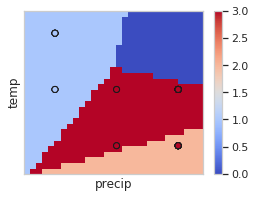

[[ 1.69531958 -2.80260723 -0.73470153  1.84198918]
 [ 1.69531958 -2.80260723 -0.73470153  1.84198918]
 [ 1.69531958 -2.80260723 -0.73470153  1.84198918]
 [ 1.69531958 -2.80260723 -0.73470153  1.84198918]
 [ 1.69531958 -2.80260723 -0.73470153  1.84198918]
 [ 1.69531958 -2.80260723 -0.73470153  1.84198918]
 [ 1.69531958 -2.80260723 -0.73470153  1.84198918]
 [ 1.69531958 -2.80260723 -0.73470153  1.84198918]
 [ 1.69531958 -2.80260723 -0.73470153  1.84198918]
 [ 1.25319419  5.30426076 -7.06685446  0.50939952]
 [-0.13495967  3.05915171 -3.69007079  0.76587875]
 [ 1.25319419  5.30426076 -7.06685446  0.50939952]
 [-0.13495967  3.05915171 -3.69007079  0.76587875]
 [ 1.25319419  5.30426076 -7.06685446  0.50939952]
 [-0.13495967  3.05915171 -3.69007079  0.76587875]
 [-0.13495967  3.05915171 -3.69007079  0.76587875]
 [ 1.25319419  5.30426076 -7.06685446  0.50939952]
 [ 1.25319419  5.30426076 -7.06685446  0.50939952]
 [ 1.25319419  5.30426076 -7.06685446  0.50939952]
 [ 0.30716573 -5.04771627  2.64

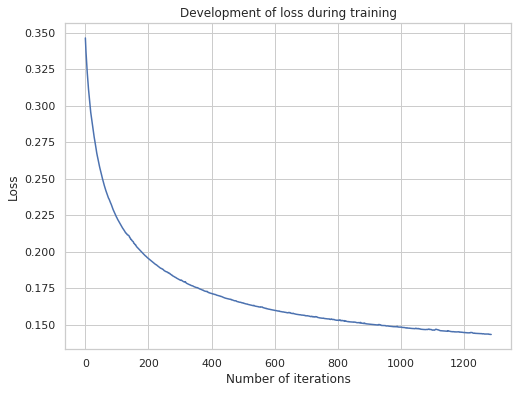

In [74]:
# 'precip',
# 'temp',
MulticlassLogReg(SoyBean, "precip", "temp")   

## Adaline


In [14]:
def FiveFold(dataset):
    """
    Argument: Data set 
    Procudure: Splits the Data into 5 different set. Each 20% of the recieved set
    """

    Fold1 = dataset[:int(len(dataset)*0.20)]
    Fold2 = dataset[int(len(dataset)*0.20):int(len(dataset)*0.40)]
    Fold3 = dataset[int(len(dataset)*0.40):int(len(dataset)*0.60)]
    Fold4 = dataset[int(len(dataset)*0.60):int(len(dataset)*0.80)]
    Fold5 = dataset[int(len(dataset)*0.80):len(dataset)]
    return Fold1, Fold2, Fold3, Fold4, Fold5

In [75]:
class CustomAdaline(object):
    
    def __init__(self, n_iterations=100, random_state=1, learning_rate=0.01):
        self.n_iterations = n_iterations
        self.random_state = random_state
        self.learning_rate = learning_rate

    '''
    Batch Gradient Descent 
    
    1. Weights are updated considering all training examples.
    2. Learning of weights can continue for multiple iterations
    3. Learning rate needs to be defined
    '''
    def fit(self, X, y):
        rgen = np.random.RandomState(self.random_state)
        self.coef_ = rgen.normal(loc=0.0, scale=0.01, size=1 + X.shape[1])
        for _ in range(self.n_iterations):
              activation_function_output = self.activation_function(self.net_input(X))
              errors = y - activation_function_output
              self.coef_[1:] = self.coef_[1:] + self.learning_rate*X.T.dot(errors)
              self.coef_[0] = self.coef_[0] + self.learning_rate*errors.sum() 
    
    '''
    Net Input is sum of weighted input signals
    '''
    def net_input(self, X):
            weighted_sum = np.dot(X, self.coef_[1:]) + self.coef_[0]
            print(weighted_sum)
            return weighted_sum
    
    '''
    Activation function is fed the net input. As the activation function is
    an identity function, the output from activation function is same as the
    input to the function.
    '''
    def activation_function(self, X):
            return X
    
    '''
    Prediction is made on the basis of output of activation function
    '''
    def predict(self, X):
        return np.where(self.activation_function(self.net_input(X)) >= 0.0, 1, 0) 
    
    '''
    Model score is calculated based on comparison of 
    expected value and predicted value
    '''
    def score(self, X, y):
        misclassified_data_count = 0
        for xi, target in zip(X, y):
            output = self.predict(xi)
            if(target != output):
                misclassified_data_count += 1
        total_data_count = len(X)
        self.score_ = (total_data_count - misclassified_data_count)/total_data_count
        return self.score_

In [65]:
def Adaline(dataset):
    '''
    Main Function for Adaline. Split the data
    Run the algorithm
    Puts the result of all fold in to a table
    '''
    # Split the dataset into training data, test data and pruning data if needed.
    train_data = dataset[:int(len(dataset)*0.90)]
    test_data = dataset[int(len(dataset)*0.90):len(dataset)]
    X_test = test_data.iloc[:, :-1]
    y_test = test_data.iloc[:, -1]
    score = []
    Fold1, Fold2, Fold3, Fold4, Fold5 = FiveFold(train_data)
    Folds = [Fold1, Fold2, Fold3, Fold4, Fold5]
    for Fold in Folds:
        X = Fold.iloc[:, :-1]
        y = Fold.iloc[:, -1]
        X = X.to_numpy()
        y = y.to_numpy()
        adaline = CustomAdaline(n_iterations = 200)
        # Fit the model
        adaline.fit(X, y)
        # Score the model
        score.append(adaline.score(X, y_test))
        
        #print(score)    
    print(tabulate([['Fold 1', score[0]], ['Fold 2', score[1]], ['Fold 3', score[2]], ['Fold 4', score[3]], ['Fold 5', score[4]]], headers=['Fold', 'Score'], tablefmt='orgtbl'))    


In [62]:
Adaline(BreastCancer)

| Fold   |    Score |
|--------+----------|
| Fold 1 | 0.540984 |
| Fold 2 | 0.544715 |
| Fold 3 | 0.540984 |
| Fold 4 | 0.544715 |
| Fold 5 | 0.544715 |


In [66]:
Adaline(Iris)

| Fold   |    Score |
|--------+----------|
| Fold 1 | 0.423077 |
| Fold 2 | 0.444444 |
| Fold 3 | 0.444444 |
| Fold 4 | 0.444444 |
| Fold 5 | 0.444444 |


In [76]:
Adaline(HouseVote)

[ 0.01487296 -0.01336645 -0.05451684 -0.04372858 -0.01056126  0.00498196
 -0.00217641  0.01659724 -0.03824729 -0.04355358 -0.03095045 -0.03597026
 -0.02472263  0.02237011  0.04083173 -0.00356256 -0.03464635  0.01509735
 -0.0461255  -0.00873556 -0.01052979 -0.03725415 -0.02552409 -0.02196666
 -0.00562129 -0.04084378 -0.0461255  -0.00860211 -0.0461255   0.01832152
 -0.04784978 -0.01474355  0.01659724 -0.02552409  0.01832152  0.01597849
  0.01370385  0.0329426  -0.03006324 -0.05745227 -0.02724837 -0.00924346
 -0.02024237 -0.03685087 -0.05034348 -0.01452518 -0.01346145 -0.00069378
  0.0130398  -0.0461255   0.02297802 -0.03824729  0.02682504 -0.01640759
  0.01234119  0.01061691  0.03121832  0.03121832  0.02949404  0.02226894
  0.01832152 -0.01624946 -0.03512659 -0.04157493  0.00286761 -0.01161624
  0.0329426  -0.03464635 -0.02552409 -0.0258072  -0.00051374 -0.04784978
 -0.00467693  0.00256311  0.00483568 -0.01049113  0.00058391 -0.01166024]
[2.81797496 2.56088533 2.01034526 2.7418416  2.054

[1.69516603e+62 1.68077090e+62 1.44328652e+62 1.97755754e+62
 1.48659739e+62 1.56945076e+62 1.54871842e+62 1.41976593e+62
 1.96418094e+62 1.34449030e+62 2.16187243e+62 1.95517195e+62
 2.50943198e+62 1.96470116e+62 1.88865799e+62 1.93078052e+62
 1.92045057e+62 1.26234316e+62 1.66711521e+62 1.76866148e+62
 2.10438622e+62 2.01220797e+62 1.56531594e+62 1.62977865e+62
 1.42253263e+62 1.45617783e+62 1.66711521e+62 1.66077489e+62
 1.66711521e+62 1.14436584e+62 1.94251531e+62 1.77766725e+62
 1.41976593e+62 1.56531594e+62 1.14436584e+62 1.99626086e+62
 1.45499485e+62 1.21251991e+62 1.66852914e+62 1.92084967e+62
 1.84071603e+62 1.23091366e+62 1.35437856e+62 1.81905040e+62
 2.08387186e+62 1.44185104e+62 1.64767030e+62 1.42583238e+62
 1.35530323e+62 1.66711521e+62 1.69890336e+62 1.96418094e+62
 1.36572614e+62 2.18172672e+62 1.31431918e+62 1.58971927e+62
 1.48792000e+62 1.48792000e+62 1.76332009e+62 2.15177292e+62
 1.14436584e+62 1.71725113e+62 1.54365031e+62 1.77960496e+62
 1.71223841e+62 1.660831

[-4.54066110e+131 -4.50210240e+131 -3.86597822e+131 -5.29707325e+131
 -3.98199047e+131 -4.20392097e+131 -4.14838746e+131 -3.80297614e+131
 -5.26124276e+131 -3.60134329e+131 -5.79077794e+131 -5.23711133e+131
 -6.72174878e+131 -5.26263623e+131 -5.05894745e+131 -5.17177661e+131
 -5.14410686e+131 -3.38130449e+131 -4.46552437e+131 -4.73752556e+131
 -5.63679574e+131 -5.38988766e+131 -4.19284548e+131 -4.36551489e+131
 -3.81038699e+131 -3.90050882e+131 -4.46552437e+131 -4.44854121e+131
 -4.46552437e+131 -3.06529118e+131 -5.20320933e+131 -4.76164836e+131
 -3.80297614e+131 -4.19284548e+131 -3.06529118e+131 -5.34717183e+131
 -3.89734008e+131 -3.24784823e+131 -4.46931170e+131 -5.14517591e+131
 -4.93053044e+131 -3.29711761e+131 -3.62782993e+131 -4.87249701e+131
 -5.58184611e+131 -3.86213316e+131 -4.41343935e+131 -3.81922569e+131
 -3.63030673e+131 -4.46552437e+131 -4.55067191e+131 -5.26124276e+131
 -3.65822549e+131 -5.84395952e+131 -3.52052712e+131 -4.25821208e+131
 -3.98553319e+131 -3.98553319e+131

[1.65317348e+26 3.00603409e+26 2.77639704e+26 2.27582909e+26
 1.70028753e+26 2.52065042e+26 2.50010003e+26 1.92166209e+26
 1.70028753e+26 2.98349741e+26 2.85835726e+26 2.07338298e+26
 2.24693719e+26 2.85655424e+26 2.04481410e+26 1.54101465e+26
 4.17189833e+26 2.49920729e+26 2.17305524e+26 2.45820648e+26
 2.26877052e+26 1.98724182e+26 2.17216250e+26 3.37076035e+26
 2.42200672e+26 4.65746559e+26 2.13225679e+26 2.35394871e+26
 6.94054660e+26 2.80516377e+26 2.80516377e+26 1.92204194e+26
 2.87481743e+26 2.92422154e+26 2.52065042e+26 2.80516377e+26
 4.29796695e+26 2.02556264e+26 2.65008298e+26 2.20229030e+26
 1.70028753e+26 3.68209959e+26 2.87481743e+26 2.05348620e+26
 3.00690702e+26 2.29965573e+26 2.87481743e+26 2.29927587e+26
 2.95937810e+26 2.55080873e+26 5.13723217e+26 3.77826969e+26
 2.07936486e+26 2.62999609e+26 2.27582909e+26 2.40862154e+26
 1.92166209e+26 2.48408386e+26 3.05431249e+26 2.27216488e+26
 2.12049703e+26 2.17530244e+26 3.25653510e+26 2.89021656e+26
 2.74208420e+26 3.004838

[-9.11327954e+84 -1.65710552e+85 -1.53051586e+85 -1.25457291e+85
 -9.37300033e+84 -1.38953305e+85 -1.37820445e+85 -1.05933491e+85
 -9.37300033e+84 -1.64468195e+85 -1.57569723e+85 -1.14297253e+85
 -1.23864597e+85 -1.57470330e+85 -1.12722365e+85 -8.49499305e+84
 -2.29979952e+85 -1.37771232e+85 -1.19791783e+85 -1.35511022e+85
 -1.25068180e+85 -1.09548638e+85 -1.19742569e+85 -1.85816441e+85
 -1.33515475e+85 -2.56747319e+85 -1.17542728e+85 -1.29763711e+85
 -3.82604379e+85 -1.54637380e+85 -1.54637380e+85 -1.05954431e+85
 -1.58477106e+85 -1.61200556e+85 -1.38953305e+85 -1.54637380e+85
 -2.36929607e+85 -1.11661110e+85 -1.46088401e+85 -1.21403394e+85
 -9.37300033e+84 -2.02979320e+85 -1.58477106e+85 -1.13200423e+85
 -1.65758673e+85 -1.26770758e+85 -1.58477106e+85 -1.26749818e+85
 -1.63138595e+85 -1.40615811e+85 -2.83194918e+85 -2.08280790e+85
 -1.14627009e+85 -1.44981092e+85 -1.25457291e+85 -1.32777604e+85
 -1.05933491e+85 -1.36937538e+85 -1.68371946e+85 -1.25255298e+85
 -1.16894460e+85 -1.19915

[8.30495022e+17 4.00760580e+17 8.14276123e+17 4.80799045e+17
 4.25684177e+17 5.67837991e+17 5.06078120e+17 6.38110404e+17
 7.44695509e+17 6.53192354e+17 6.89739519e+17 6.15596267e+17
 5.34127656e+17 7.02888636e+17 5.51597609e+17 6.02881928e+17
 4.55386956e+17 6.65060858e+17 5.27574457e+17 5.48556565e+17
 5.93191941e+17 7.55437934e+17 5.07097002e+17 9.15348128e+17
 5.11757746e+17 5.66587704e+17 1.53636809e+18 5.11757746e+17
 5.88531196e+17 5.64121621e+17 5.60333108e+17 8.88053334e+17
 4.61859954e+17 6.04833715e+17 7.01573242e+17 5.03040839e+17
 4.29973534e+17 6.08137922e+17 5.00105965e+17 6.95473865e+17
 5.26469550e+17 6.85538371e+17 6.44133572e+17 4.75289450e+17
 5.14223829e+17 5.88091165e+17 5.07097002e+17 5.06957019e+17
 5.05542251e+17 4.09216123e+17 6.35565462e+17 5.11407729e+17
 5.41175615e+17 4.74420533e+17 4.99233734e+17 4.66520699e+17
 5.48903875e+17 5.31120154e+17 7.42329252e+17 7.27532005e+17
 4.00760580e+17 7.38155187e+17 5.12119056e+17 5.28446688e+17
 5.45375388e+17 5.968802

[6.95260536e+83 3.35502331e+83 6.81682657e+83 4.02507652e+83
 3.56367469e+83 4.75373524e+83 4.23670384e+83 5.34203059e+83
 6.23432272e+83 5.46829125e+83 5.77425095e+83 5.15355034e+83
 4.47152445e+83 5.88433063e+83 4.61777661e+83 5.04711047e+83
 3.81233566e+83 5.56765009e+83 4.41666343e+83 4.59231809e+83
 4.96598939e+83 6.32425444e+83 4.24523355e+83 7.66296501e+83
 4.28425162e+83 4.74326829e+83 1.28619206e+84 4.28425162e+83
 4.92697131e+83 4.72262314e+83 4.69090706e+83 7.43446282e+83
 3.86652527e+83 5.06345013e+83 5.87331862e+83 4.21127682e+83
 3.59958364e+83 5.09111176e+83 4.18670710e+83 5.82225683e+83
 4.40741355e+83 5.73908046e+83 5.39245438e+83 3.97895218e+83
 4.30489678e+83 4.92328753e+83 4.24523355e+83 4.24406166e+83
 4.23221774e+83 3.42581007e+83 5.32072525e+83 4.28132141e+83
 4.53052743e+83 3.97167792e+83 4.17940510e+83 3.90554335e+83
 4.59522564e+83 4.44634673e+83 6.21451327e+83 6.09063604e+83
 3.35502331e+83 6.17956950e+83 4.28727638e+83 4.42396543e+83
 4.56568642e+83 4.996866

[5.57597029e+108 2.69071943e+108 5.46707608e+108 3.22810025e+108
 2.85805726e+108 3.81248254e+108 3.39782477e+108 4.28429378e+108
 4.99990960e+108 4.38555448e+108 4.63093332e+108 4.13313314e+108
 3.58615026e+108 4.71921691e+108 3.70344409e+108 4.04776866e+108
 3.05748267e+108 4.46523999e+108 3.54215187e+108 3.68302642e+108
 3.98270977e+108 5.07203459e+108 3.40466558e+108 6.14567677e+108
 3.43595797e+108 3.80408807e+108 1.03152248e+109 3.43595797e+108
 3.95141738e+108 3.78753071e+108 3.76209451e+108 5.96241865e+108
 3.10094259e+108 4.06087302e+108 4.71038531e+108 3.37743238e+108
 2.88685614e+108 4.08305757e+108 3.35772753e+108 4.66943390e+108
 3.53473349e+108 4.60272668e+108 4.32473352e+108 3.19110866e+108
 3.45251533e+108 3.94846300e+108 3.40466558e+108 3.40372573e+108
 3.39422694e+108 2.74749021e+108 4.26720696e+108 3.43360794e+108
 3.63347048e+108 3.18527472e+108 3.35187135e+108 3.13223498e+108
 3.68535827e+108 3.56595779e+108 4.98402248e+108 4.88467328e+108
 2.69071943e+108 4.955997

[-6.64149595e+11 -7.18249852e+11 -8.17189729e+11 -1.12691701e+12
 -7.99282160e+11 -9.83774281e+11 -9.90520560e+11 -7.85284392e+11
 -9.91946541e+11 -7.58300225e+11 -9.06283897e+11 -9.46218641e+11
 -8.24391267e+11 -2.57136795e+12 -9.12240384e+11 -5.56923886e+11
 -5.56923886e+11 -9.07728655e+11 -6.93398078e+11 -7.75272767e+11
 -9.47430010e+11 -3.65941354e+11 -6.78256706e+11 -7.61340402e+11
 -6.95775528e+11 -7.75272767e+11 -1.54258120e+12 -9.97093313e+11
 -9.20170300e+11 -9.20170300e+11 -7.75272767e+11 -6.64149595e+11
 -7.73168725e+11 -9.20170300e+11 -6.95775528e+11 -8.25491847e+11
 -8.40542920e+11 -9.99667539e+11 -1.02841537e+12 -7.82491606e+11
 -5.80106012e+11 -6.03048726e+11 -8.96520606e+11 -6.51602339e+11
 -5.94625386e+11 -7.94063175e+11 -1.01894381e+12 -7.17752778e+11
 -6.51602339e+11 -1.01099503e+12 -9.23074450e+11 -1.39181329e+12
 -1.20541537e+12 -1.04696779e+12 -1.09552140e+12 -1.22521244e+12
 -1.05710851e+12 -1.05425362e+12 -1.18150309e+12 -1.07915672e+12
 -1.64382020e+12 -9.05360

[1.42567538e+80 1.54180796e+80 1.75419407e+80 2.41906017e+80
 1.71575336e+80 2.11178744e+80 2.12626912e+80 1.68570550e+80
 2.12933016e+80 1.62778081e+80 1.94544520e+80 2.03116984e+80
 1.76965302e+80 5.51974437e+80 1.95823150e+80 1.19550276e+80
 1.19550276e+80 1.94854654e+80 1.48846070e+80 1.66421437e+80
 2.03377018e+80 7.85536247e+79 1.45595796e+80 1.63430690e+80
 1.49356417e+80 1.66421437e+80 3.31133235e+80 2.14037832e+80
 1.97525400e+80 1.97525400e+80 1.66421437e+80 1.42567538e+80
 1.65969779e+80 1.97525400e+80 1.49356417e+80 1.77201554e+80
 1.80432444e+80 2.14590419e+80 2.20761480e+80 1.67971046e+80
 1.24526593e+80 1.29451517e+80 1.92448714e+80 1.39874122e+80
 1.27643347e+80 1.70455019e+80 2.18728299e+80 1.54074093e+80
 1.39874122e+80 2.17021999e+80 1.98148810e+80 2.98769127e+80
 2.58756617e+80 2.24743975e+80 2.35166581e+80 2.63006290e+80
 2.26920802e+80 2.26307966e+80 2.53623564e+80 2.31653709e+80
 3.52865380e+80 1.94346380e+80 2.69958674e+80 1.70933608e+80
 2.30324859e+80 2.013587

-3.2318268785027156e+137
-2.7685952659876882e+137
-3.2230558996970957e+137
-3.835851370871439e+137
-2.900432139668987e+137
-3.44117174014238e+137
-3.5039141256389163e+137
-4.167246109705168e+137
-4.287085240143347e+137
-3.261919561837116e+137
-2.4182484943840034e+137
-2.5138882264756158e+137
-3.7372644995869695e+137
-2.7162903706268697e+137
[ 0.02048863 -0.01942476  0.00263439  0.00706092  0.00510839 -0.01584909
 -0.02196666  0.0387708  -0.00374464 -0.04464021  0.00541987 -0.00227989
  0.00295576 -0.00440513  0.01659724 -0.03512659 -0.00046089  0.0329426
 -0.03253009 -0.04256806 -0.01412481 -0.02827769  0.01417435 -0.01444561
 -0.02024237  0.0057164  -0.00311573  0.01973917  0.019082   -0.01804324
  0.01601086 -0.02010514  0.0217296   0.03650004  0.03210675 -0.01056975
 -0.00104783 -0.01502052  0.00785606 -0.00874088 -0.00244313  0.00621433
  0.02198255  0.02360324  0.02360324 -0.00050869 -0.00470278  0.01898519
  0.00239283 -0.0101221  -0.00188989 -0.00689756  0.00691129 -0.01445437
 

 1.87550422e+30 2.43788000e+30]
[-8.89689470e+30 -1.03883809e+31 -1.34783415e+31 -6.70721171e+30
 -6.31810253e+30 -7.29405963e+30 -7.85333077e+30 -8.40357894e+30
 -8.03111121e+30 -1.21982936e+31 -1.17300638e+31 -6.92759871e+30
 -8.26875122e+30 -8.04853862e+30 -7.60741764e+30 -7.45332130e+30
 -1.10263353e+31 -6.78491204e+30 -9.55905138e+30 -8.57277186e+30
 -5.89479961e+30 -9.51318648e+30 -9.45001286e+30 -8.23864141e+30
 -6.45407075e+30 -7.79446324e+30 -6.63400954e+30 -7.33027626e+30
 -1.38440784e+31 -9.94166672e+30 -6.49281390e+30 -7.19099513e+30
 -7.90631474e+30 -7.33131175e+30 -6.49132287e+30 -8.98282340e+30
 -1.04114293e+31 -6.87886529e+30 -1.07083743e+31 -1.03089464e+31
 -9.48590421e+30 -9.32042029e+30 -7.61633641e+30 -5.35529731e+30
 -5.35529731e+30 -1.23567181e+31 -8.77019393e+30 -8.06878043e+30
 -1.02307719e+31 -1.01938200e+31 -6.74724798e+30 -8.33339165e+30
 -6.40731303e+30 -7.97365769e+30 -1.10552344e+31 -7.61212613e+30
 -7.05467943e+30 -1.22460278e+31 -1.08132175e+31 -8.360797

 5.40985723e+71 7.03201979e+71]
[-2.56629282e+72 -2.99650926e+72 -3.88780269e+72 -1.93468281e+72
 -1.82244499e+72 -2.10395801e+72 -2.26527874e+72 -2.42399681e+72
 -2.31655918e+72 -3.51857524e+72 -3.38351522e+72 -1.99825304e+72
 -2.38510600e+72 -2.32158608e+72 -2.19434555e+72 -2.14989675e+72
 -3.18052603e+72 -1.95709533e+72 -2.75729070e+72 -2.47280019e+72
 -1.70034405e+72 -2.74406105e+72 -2.72583873e+72 -2.37642088e+72
 -1.86166477e+72 -2.24829851e+72 -1.91356778e+72 -2.11440463e+72
 -3.99329880e+72 -2.86765538e+72 -1.87284016e+72 -2.07422925e+72
 -2.28056187e+72 -2.11470332e+72 -1.87241008e+72 -2.59107880e+72
 -3.00315754e+72 -1.98419597e+72 -3.08881077e+72 -2.97359652e+72
 -2.73619153e+72 -2.68845800e+72 -2.19691815e+72 -1.54472561e+72
 -1.54472561e+72 -3.56427249e+72 -2.52974622e+72 -2.32742479e+72
 -2.95104724e+72 -2.94038854e+72 -1.94623120e+72 -2.40375141e+72
 -1.84817759e+72 -2.29998682e+72 -3.18886191e+72 -2.19570371e+72
 -2.03490924e+72 -3.53234409e+72 -3.11905259e+72 -2.411656

 5.90471059e+121 7.67525648e+121]
[-2.80103814e+122 -3.27060757e+122 -4.24342987e+122 -2.11165316e+122
 -1.98914866e+122 -2.29641239e+122 -2.47248953e+122 -2.64572594e+122
 -2.52846072e+122 -3.84042824e+122 -3.69301394e+122 -2.18103831e+122
 -2.60327769e+122 -2.53394745e+122 -2.39506790e+122 -2.34655325e+122
 -3.47145682e+122 -2.13611581e+122 -3.00950707e+122 -2.69899350e+122
 -1.85587883e+122 -2.99506727e+122 -2.97517812e+122 -2.59379813e+122
 -2.03195597e+122 -2.45395608e+122 -2.08860668e+122 -2.30781459e+122
 -4.35857598e+122 -3.12996709e+122 -2.04415360e+122 -2.26396426e+122
 -2.48917065e+122 -2.30814060e+122 -2.04368418e+122 -2.82809135e+122
 -3.27786398e+122 -2.16569541e+122 -3.37135212e+122 -3.24559894e+122
 -2.98647791e+122 -2.93437807e+122 -2.39787583e+122 -1.68602558e+122
 -1.68602558e+122 -3.89030554e+122 -2.76114853e+122 -2.54032024e+122
 -3.22098702e+122 -3.20935334e+122 -2.12425791e+122 -2.62362865e+122
 -2.01723509e+122 -2.51037245e+122 -3.48055520e+122 -2.39655029e+122


In [20]:
Adaline(SoyBean)

| Fold   |    Score |
|--------+----------|
| Fold 1 | 0.375    |
| Fold 2 | 0.375    |
| Fold 3 | 0.375    |
| Fold 4 | 0.375    |
| Fold 5 | 0.444444 |


In [21]:
Adaline(Glass)

| Fold   |    Score |
|--------+----------|
| Fold 1 | 0.421053 |
| Fold 2 | 0.421053 |
| Fold 3 | 0.421053 |
| Fold 4 | 0.421053 |
| Fold 5 | 0.435897 |


In [22]:
class LogisticRegression:
    
    def fit(self, X, y, lr = 0.001, epochs=10000, verbose=True, batch_size=1):
        self.classes = np.unique(y)
        # get classes unique value
        y = (y==self.classes[1]) * 1
        X = self.add_bias(X)
        # Init weights to zero
        self.weights = np.zeros(X.shape[1])
        self.loss = []
        for i in range(epochs):
            #gets linear combination of input features and weights, apply sigmoid function
            self.loss.append(self.cross_entropy(X,y))
            if i % 1000 == 0 and verbose: 
                print('Iterations: %d - Error : %.4f' %(i, self.loss[i]))
            idx = np.random.choice(X.shape[0], batch_size)
            X_batch, y_batch =  X[idx], y[idx]
            #Compute the gradient of the cost function with respect to the weight vector and bias.
            #Update the weights and bias
            self.weights -= lr * self.get_gradient(X_batch, y_batch)
        return self
    
    def get_gradient(self, X, y):
        '''
        Compute the gradient of the cost function with respect to the weight vector
        '''
        return -1.0 * (y - self.predict_(X)).dot(X) / len(X)
    
    def predict_(self, X):
        '''
        Take the data matrix and do the dot product with the wieight and send with the activation function
        '''
        return self.sigmoid(np.dot(X, self.weights))
    
    def predict(self, X):
        '''
        Return Prediction
        '''
        return self.predict_(self.add_bias(X))
    
    def sigmoid(self, z):
        ''' 
        logistic(sigmoid) function for activation function
        '''
        return 1.0/(1 + np.exp(-z))
    
    def predict_classes(self, X):
        '''
        Return the classification
        '''
        return self.predict_classes_(self.add_bias(X))

    def predict_classes_(self, X):
        '''
        Depending on close to which probablibily prediction falls on select the class
        '''
        return np.vectorize(lambda c: self.classes[1] if c>=0.5 else self.classes[0])(self.predict_(X))
    
    def cross_entropy(self, X, y):
        '''
        the cross-entropy loss function
        '''
        p = self.predict_(X)
        return (-1 / len(y)) * (y * np.log(p)).sum()

    def add_bias(self,X):
        '''
        This is to add bias to the Data
        '''
        return np.insert(X, 0, 1, axis=1)

    def score(self, X, y):
        '''
        TReturns the accracy score of algo using the loss fucntion. 
        '''
        return self.cross_entropy(self.add_bias(X), y)

In [23]:
from sklearn.metrics import accuracy_score
def train_model(X, y, model):
    model.fit(X, y, lr=0.1)
    pre = model.predict_classes(X)
    print('Accuracy :: ', accuracy_score(y, pre))

In [24]:
def LogisticRegressionRegular(Dataset):
    X = Dataset.iloc[:, :-1]
    Y = Dataset.iloc[:, -1]
    X = X.to_numpy()
    Y = Y.to_numpy()
    lr = LogisticRegression()
    train_model(X,(Y !=0 )*1, lr)
    
    fig = plt.figure(figsize=(8,6))
    plt.plot(np.arange(len(lr.loss)), lr.loss)
    plt.title("Development of cost over training")
    plt.xlabel("Number of iterations")
    plt.ylabel("Cost")
    plt.show()


Iterations: 0 - Error : 0.4652
Iterations: 1000 - Error : 0.0027
Iterations: 2000 - Error : 0.0012
Iterations: 3000 - Error : 0.0011
Iterations: 4000 - Error : 0.0011
Iterations: 5000 - Error : 0.0006
Iterations: 6000 - Error : 0.0007
Iterations: 7000 - Error : 0.0006
Iterations: 8000 - Error : 0.0006
Iterations: 9000 - Error : 0.0006
Accuracy ::  1.0


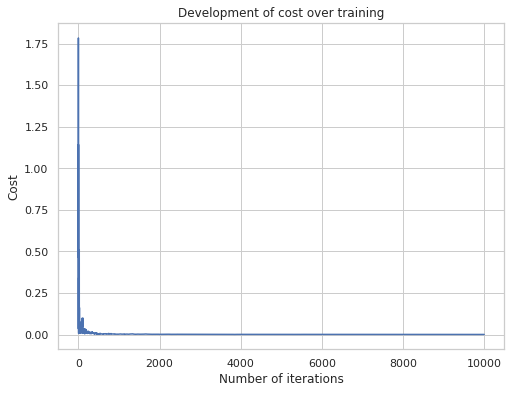

In [25]:
LogisticRegressionRegular(Iris)

Iterations: 0 - Error : 0.4502
Iterations: 1000 - Error : 0.0088
Iterations: 2000 - Error : 0.1106
Iterations: 3000 - Error : 0.3123
Iterations: 4000 - Error : 0.1794
Iterations: 5000 - Error : 0.0000
Iterations: 6000 - Error : 0.1743
Iterations: 7000 - Error : 0.0797
Iterations: 8000 - Error : 0.3761
Iterations: 9000 - Error : 0.2706
Accuracy ::  0.9545454545454546


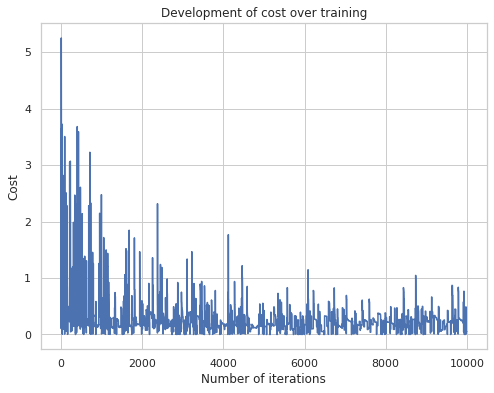

In [26]:
LogisticRegressionRegular(BreastCancer)

Iterations: 0 - Error : 0.5575
Iterations: 1000 - Error : 0.0014
Iterations: 2000 - Error : 0.0005
Iterations: 3000 - Error : 0.0004
Iterations: 4000 - Error : 0.0004
Iterations: 5000 - Error : 0.0003
Iterations: 6000 - Error : 0.0002
Iterations: 7000 - Error : 0.0002
Iterations: 8000 - Error : 0.0002
Iterations: 9000 - Error : 0.0002
Accuracy ::  1.0


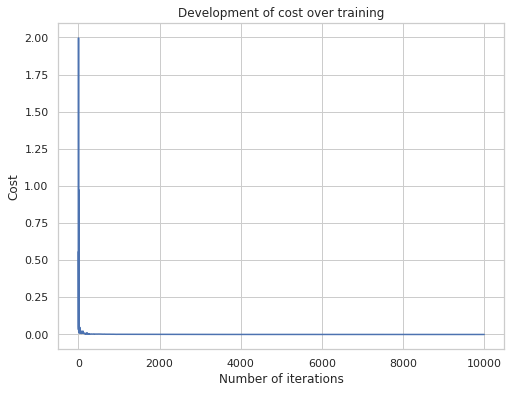

In [27]:
LogisticRegressionRegular(SoyBean)

Iterations: 0 - Error : 0.2667
Iterations: 1000 - Error : 0.0403
Iterations: 2000 - Error : 0.0622
Iterations: 3000 - Error : 0.0200
Iterations: 4000 - Error : 0.0730
Iterations: 5000 - Error : 0.0206
Iterations: 6000 - Error : 0.0378
Iterations: 7000 - Error : 0.0221
Iterations: 8000 - Error : 0.0342
Iterations: 9000 - Error : 0.0939
Accuracy ::  0.956221198156682


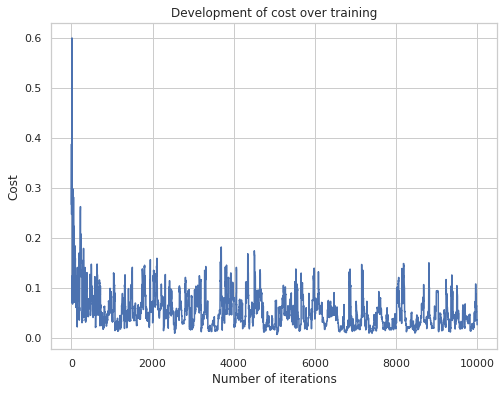

In [28]:
LogisticRegressionRegular(HouseVote)

Iterations: 0 - Error : 0.4686
Iterations: 1000 - Error : nan
Iterations: 2000 - Error : nan
Iterations: 3000 - Error : nan
Iterations: 4000 - Error : nan
Iterations: 5000 - Error : nan
Iterations: 6000 - Error : nan
Iterations: 7000 - Error : nan
Iterations: 8000 - Error : nan
Iterations: 9000 - Error : nan
Accuracy ::  1.0


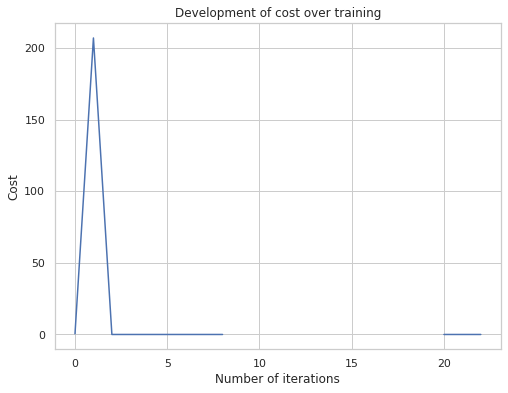

In [29]:
LogisticRegressionRegular(Glass)